# Read in data + EDA

In [ ]:
!pip install Pillow
!pip install gdown
!pip install darts
# https://exerror.com/typeerror-load-missing-1-required-positional-argument-loader/
!pip install pyyaml==5.4.1

In [ ]:
import pandas as pd
import numpy as np
import os
from google.colab import drive
import matplotlib.pyplot as plt
from io import BytesIO
from PIL import Image
import requests
import gc
import math
from itertools import product
import ast
# from IPython.display import display, HTML
# CSS = """
# .output {
#     flex-direction: row;
# }
# """

# HTML('<style>{}</style>'.format(CSS))

import torch
from darts import TimeSeries

from darts.models import (
    RNNModel,
    TCNModel,
    TransformerModel,
    NBEATSModel,
    BlockRNNModel,
)
from darts.metrics import mape, smape
from darts.dataprocessing.transformers import Scaler
from darts.utils.timeseries_generation import datetime_attribute_timeseries

/usr/local/lib/python3.7/dist-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


## File Management:
**Dan:** connected to drive folder via mount. Make changes to underlying df_2019 or df_2020s via this only.
<br>
**Jason/Others:** connected via gdown, assumes underlying df_2019 and df_2020s are downloaded too. Changes made are not saved to drive and are temporary in Colab's FS. 
<br>
*Note:* processing files is actually faster on local FS but for sanity and consistency, changes are made on gdrive via mount

In [ ]:
try: # Dan
    drive.mount('/gdrive/')
    # !ls /gdrive
    project_path = '/gdrive/MyDrive/Northwestern/CompSci/de200/data'
    my_data_path = os.path.join(project_path, "data/my_data")
    os.chdir(project_path)
except Exception as e:
    # Jason
    !gdown https://drive.google.com/drive/u/1/folders/1j0O8ft4HYvFLyT86VEIjnSCaLVPLMXg6 -O de200data --folder &> /dev/null
    #drive.mount("/gdrive/", force_remount=True)
    os.chdir('de200data')
    

Mounted at /gdrive/


In [ ]:
!gdown --id 1j0O8ft4HYvFLyT86VEIjnSCaLVPLMXg6 -O de200data --folder &> /dev/null

In [ ]:
os.listdir()

['Divvy_Trips_2019_Q1.csv',
 'Divvy_Trips_2019_Q2.csv',
 'Divvy_Trips_2019_Q3.csv',
 'Divvy_Trips_2019_Q4.csv',
 'Divvy_Trips_2020_Q1.csv',
 '202004-divvy-tripdata.csv',
 '202005-divvy-tripdata.csv',
 '202006-divvy-tripdata.csv',
 '202007-divvy-tripdata.csv',
 '202008-divvy-tripdata.csv',
 '202009-divvy-tripdata.csv',
 '202010-divvy-tripdata.csv',
 '202011-divvy-tripdata.csv',
 '202012-divvy-tripdata.csv',
 '202101-divvy-tripdata.csv',
 '202102-divvy-tripdata.csv',
 '202103-divvy-tripdata.csv',
 '202104-divvy-tripdata.csv',
 '202105-divvy-tripdata.csv',
 '202106-divvy-tripdata.csv',
 '202107-divvy-tripdata.csv',
 '202108-divvy-tripdata.csv',
 '202109-divvy-tripdata.csv',
 '202110-divvy-tripdata.csv',
 '202111-divvy-tripdata.csv',
 '202112-divvy-tripdata.csv',
 'Divvy_Bicycle_Stations.csv',
 'df_2019.csv',
 'df_2020s.csv',
 'CTA_L.csv']

## CTA L Train Information

Data Source: https://data.cityofchicago.org/Transportation/CTA-System-Information-List-of-L-Stops/8pix-ypme

In [ ]:
ctaL = pd.read_csv('CTA_L.csv')
ctaL['Location'] = ctaL['Location'].apply(ast.literal_eval) #from string of tup to tup
ctaL['Line'] = ctaL.loc[:,"RED":"O"].idxmax(axis=1) # for color
ctaL['lats'], ctaL['lgts'] = zip(*ctaL['Location'])
# L_lats, L_lgts = zip(*ctaL['Location'])
ctaL.head()
# identify by "STATION_NAME", has useful "Location"

,STOP_ID,DIRECTION_ID,STOP_NAME,STATION_NAME,STATION_DESCRIPTIVE_NAME,MAP_ID,ADA,RED,BLUE,G,BRN,P,Pexp,Y,Pnk,O,Location,Line,lats,lgts
0,30186,S,Pulaski (Midway-bound),Pulaski,Pulaski (Orange Line),40960,True,False,False,False,False,False,False,False,False,True,"(41.799756, -87.724493)",O,41.799756,-87.724493
1,30223,N,Garfield (Howard-bound),Garfield,Garfield (Red Line),41170,True,True,False,False,False,False,False,False,False,False,"(41.79542, -87.631157)",RED,41.795420,-87.631157
2,30160,S,Rosemont (Forest Pk-bound),Rosemont,Rosemont (Blue Line),40820,True,False,True,False,False,False,False,False,False,False,"(41.983507, -87.859388)",BLUE,41.983507,-87.859388
3,30241,N,Central (Linden-bound),Central,Central (Purple Line),41250,False,False,False,False,False,True,True,False,False,False,"(42.063987, -87.685617)",P,42.063987,-87.685617
4,30119,E,Ridgeland (63rd-bound),Ridgeland,Ridgeland (Green Line),40610,False,False,False,True,False,False,False,False,False,False,"(41.887159, -87.783661)",G,41.887159,-87.783661


In [ ]:
ctaL_colormap = {"RED":"red","BLUE":"blue","G":"green","BRN":"brown","P":"purple","Pexp":"purple","Y":"yellow","Pnk":"pink","O":"orange"}

## EDA of stations information
Station Information and ID Mapping: https://data.cityofchicago.org/Transportation/Divvy-Bicycle-Stations/bbyy-e7gq

In [ ]:
stations = pd.read_csv('Divvy_Bicycle_Stations.csv')
stations.head()

,ID,Station Name,Total Docks,Docks in Service,Status,Latitude,Longitude,Location
0,186,Ogden Ave & Race Ave,15,15,In Service,41.891795,-87.658751,"(41.891795, -87.658751)"
1,184,State St & 35th St,19,19,In Service,41.831036,-87.626798,"(41.8310363140161, -87.62679755687714)"
2,176,Clark St & Elm St,39,39,In Service,41.902973,-87.631280,"(41.902973, -87.63128)"
3,648,Carpenter St & 63rd St,7,7,In Service,41.779870,-87.650919,"(41.77987, -87.650919)"
4,658,Leavitt St & Division St,15,15,In Service,41.902997,-87.683825,"(41.902997, -87.683825)"


In [ ]:
stations[stations.Status != "In Service"]

,ID,Station Name,Total Docks,Docks in Service,Status,Latitude,Longitude,Location
28,1594046452557910996,472,9,9,Not Installed,41.934003,-87.690823,"(41.934003, -87.690823)"
430,254,Pine Grove Ave & Irving Park Rd,15,15,Not In Service,41.954383,-87.648043,"(41.954383, -87.648043)"
488,228,Damen Ave & Melrose Ave,15,15,Not In Service,41.940600,-87.678500,"(41.9406, -87.6785)"
802,1594046431052911342,California Ave & Berteau Ave,9,9,Not Installed,41.957573,-87.697830,"(41.957573, -87.69783)"


In [ ]:
stations[stations['Docks in Service']!=stations['Total Docks']]

,ID,Station Name,Total Docks,Docks in Service,Status,Latitude,Longitude,Location


## EDA of trip data files

In [ ]:
for f in os.listdir():
    print(f)
    print(pd.read_csv(f).columns)

Divvy_Trips_2019_Q1.csv
Index(['trip_id', 'start_time', 'end_time', 'bikeid', 'tripduration',
       'from_station_id', 'from_station_name', 'to_station_id',
       'to_station_name', 'usertype', 'gender', 'birthyear'],
      dtype='object')
Divvy_Trips_2019_Q2.csv
Index(['01 - Rental Details Rental ID', '01 - Rental Details Local Start Time',
       '01 - Rental Details Local End Time', '01 - Rental Details Bike ID',
       '01 - Rental Details Duration In Seconds Uncapped',
       '03 - Rental Start Station ID', '03 - Rental Start Station Name',
       '02 - Rental End Station ID', '02 - Rental End Station Name',
       'User Type', 'Member Gender',
       '05 - Member Details Member Birthday Year'],
      dtype='object')
Divvy_Trips_2019_Q3.csv
Index(['trip_id', 'start_time', 'end_time', 'bikeid', 'tripduration',
       'from_station_id', 'from_station_name', 'to_station_id',
       'to_station_name', 'usertype', 'gender', 'birthyear'],
      dtype='object')
Divvy_Trips_2019_Q4.csv


In [ ]:
d = pd.read_csv('202112-divvy-tripdata.csv')
d.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
0,46F8167220E4431F,electric_bike,2021-12-07 15:06:07,2021-12-07 15:13:42,Laflin St & Cullerton St,13307,Morgan St & Polk St,TA1307000130,41.854833,-87.663660,41.871969,-87.650965,member
1,73A77762838B32FD,electric_bike,2021-12-11 03:43:29,2021-12-11 04:10:23,LaSalle Dr & Huron St,KP1705001026,Clarendon Ave & Leland Ave,TA1307000119,41.894405,-87.632331,41.967968,-87.650001,casual
2,4CF42452054F59C5,electric_bike,2021-12-15 23:10:28,2021-12-15 23:23:14,Halsted St & North Branch St,KA1504000117,Broadway & Barry Ave,13137,41.899357,-87.648522,41.937582,-87.644098,member
3,3278BA87BF698339,classic_bike,2021-12-26 16:16:10,2021-12-26 16:30:53,Halsted St & North Branch St,KA1504000117,LaSalle Dr & Huron St,KP1705001026,41.899390,-87.648545,41.894877,-87.632326,member
4,6FF54232576A3B73,electric_bike,2021-12-30 11:31:05,2021-12-30 11:51:21,Leavitt St & Chicago Ave,18058,Clark St & Drummond Pl,TA1307000142,41.895579,-87.682024,41.931248,-87.644336,member


In [ ]:
d.start_station_id.unique()

array(['13307', 'KP1705001026', 'KA1504000117', '18058', 'SL-012',
       'KA1503000012', '18003', '13150', '624', '525', 'TA1306000012',
       'TA1307000134', '18062', '600', 'SL-008', '17660', '20246.0',
       'TA1307000061', 'TA1309000063', 'TA1309000061', 'TA1307000052',
       '13253', 'TA1309000042', '13206', '15571', 'TA1309000030', '13156',
       '15623', '13056', 'TA1309000036', '13296', 'TA1308000021',
       'KA1504000152', '632', '18067', '642', 'KA1504000155',
       'KA1706005015', '20251.0', 'TA1308000006', 'TA1307000153', '647',
       '620', '658', 'TA1305000034', 'TA1305000029', 'KA1504000109',
       '13006', '13263', 'SL-005', '13033', 'TA1307000158',
       'TA1307000107', 'TA1307000119', 'KA1504000146', 'TA1306000025',
       '13154', '637', '13063', 'TA1307000006', '13285', 'TA1308000029',
       '15666', '331', '13191', 'RN-', '13193', '13243', 'TA1309000050',
       '13430', '13128', '654', '13300', 'TA1307000113', 'TA1309000004',
       '13124', '13132', 'T

In [ ]:
d.shape, d.dropna().shape

((247540, 13), (176371, 13))

In [ ]:
df = pd.read_csv('Divvy_Trips_2019_Q2.csv')

In [ ]:
df.head()

,01 - Rental Details Rental ID,01 - Rental Details Local Start Time,01 - Rental Details Local End Time,01 - Rental Details Bike ID,01 - Rental Details Duration In Seconds Uncapped,03 - Rental Start Station ID,03 - Rental Start Station Name,02 - Rental End Station ID,02 - Rental End Station Name,User Type,Member Gender,05 - Member Details Member Birthday Year
0,22178529,2019-04-01 00:02:22,2019-04-01 00:09:48,6251,446.0,81,Daley Center Plaza,56,Desplaines St & Kinzie St,Subscriber,Male,1975.0
1,22178530,2019-04-01 00:03:02,2019-04-01 00:20:30,6226,"1,048.0",317,Wood St & Taylor St,59,Wabash Ave & Roosevelt Rd,Subscriber,Female,1984.0
2,22178531,2019-04-01 00:11:07,2019-04-01 00:15:19,5649,252.0,283,LaSalle St & Jackson Blvd,174,Canal St & Madison St,Subscriber,Male,1990.0
3,22178532,2019-04-01 00:13:01,2019-04-01 00:18:58,4151,357.0,26,McClurg Ct & Illinois St,133,Kingsbury St & Kinzie St,Subscriber,Male,1993.0
4,22178533,2019-04-01 00:19:26,2019-04-01 00:36:13,3270,"1,007.0",202,Halsted St & 18th St,129,Blue Island Ave & 18th St,Subscriber,Male,1992.0


In [ ]:
df.shape, df.dropna().shape

((1108163, 12), (922608, 12))

In [ ]:
dff = pd.read_csv('Divvy_Trips_2019_Q1.csv')

In [ ]:
dff.head()

,trip_id,start_time,end_time,bikeid,tripduration,from_station_id,from_station_name,to_station_id,to_station_name,usertype,gender,birthyear
0,21742443,2019-01-01 00:04:37,2019-01-01 00:11:07,2167,390.0,199,Wabash Ave & Grand Ave,84,Milwaukee Ave & Grand Ave,Subscriber,Male,1989.0
1,21742444,2019-01-01 00:08:13,2019-01-01 00:15:34,4386,441.0,44,State St & Randolph St,624,Dearborn St & Van Buren St (*),Subscriber,Female,1990.0
2,21742445,2019-01-01 00:13:23,2019-01-01 00:27:12,1524,829.0,15,Racine Ave & 18th St,644,Western Ave & Fillmore St (*),Subscriber,Female,1994.0
3,21742446,2019-01-01 00:13:45,2019-01-01 00:43:28,252,"1,783.0",123,California Ave & Milwaukee Ave,176,Clark St & Elm St,Subscriber,Male,1993.0
4,21742447,2019-01-01 00:14:52,2019-01-01 00:20:56,1170,364.0,173,Mies van der Rohe Way & Chicago Ave,35,Streeter Dr & Grand Ave,Subscriber,Male,1994.0


## EDA Findings
Observations: 2019 different columns with Q2 having different naming but same data, 2020, 2021 same columns. <br>
Drop missing value rows. Some miss start/end location information. Coordinate not precise enough.

Columns of interest from intersection of the 2 types are: 
- bikeid (2019)
- started_at, ended_at (time), start_time, end_time (2019)
- start_station_id, end_station_id (2020-2021) 
from_station_id, to_station_id (2019 )
- member_casual (2020-2021), usertype (2019)
- rideable_type (2020-2021)

## Build 1 csv containing all information

### Build 2019

In [ ]:
f2019s = ['Divvy_Trips_2019_Q1.csv',
          "Divvy_Trips_2019_Q2.csv",
          'Divvy_Trips_2019_Q3.csv',
          'Divvy_Trips_2019_Q4.csv',]

In [ ]:
def build_2019():
    for f in f2019s:
        if f == "Divvy_Trips_2019_Q2.csv":
            _df = pd.read_csv(f)
            _df.set_axis(['trip_id', 'start_time', 'end_time', 'bikeid', 'tripduration',
       'from_station_id', 'from_station_name', 'to_station_id',
       'to_station_name', 'usertype', 'gender', 'birthyear'], axis=1, inplace=True)
        else:
            _df = pd.read_csv(f)
        _df = _df[["bikeid","start_time","end_time","from_station_name","to_station_name","usertype"]]
        _df[['start_time','end_time']] = _df[['start_time','end_time']].apply(pd.to_datetime, errors='coerce')
        _df.dropna(inplace=True)
        yield _df

In [ ]:
if os.path.exists('df_2019.csv'):
    df_2019 = pd.read_csv('df_2019.csv', parse_dates=["start_time","end_time"], infer_datetime_format=True)
else:
    df_2019 = pd.concat(build_2019())
    df_2019.to_csv('df_2019.csv', index=False)

In [ ]:
df_2019.head()

,bikeid,start_time,end_time,from_station_name,to_station_name,usertype
0,2167,2019-01-01 00:04:37,2019-01-01 00:11:07,Wabash Ave & Grand Ave,Milwaukee Ave & Grand Ave,Subscriber
1,4386,2019-01-01 00:08:13,2019-01-01 00:15:34,State St & Randolph St,Dearborn St & Van Buren St (*),Subscriber
2,1524,2019-01-01 00:13:23,2019-01-01 00:27:12,Racine Ave & 18th St,Western Ave & Fillmore St (*),Subscriber
3,252,2019-01-01 00:13:45,2019-01-01 00:43:28,California Ave & Milwaukee Ave,Clark St & Elm St,Subscriber
4,1170,2019-01-01 00:14:52,2019-01-01 00:20:56,Mies van der Rohe Way & Chicago Ave,Streeter Dr & Grand Ave,Subscriber


In [ ]:
df_2019.dtypes

bikeid                        int64
start_time           datetime64[ns]
end_time             datetime64[ns]
from_station_name            object
to_station_name              object
usertype                     object
dtype: object

### Build 2020, 2021

In [ ]:
f2020s = ['Divvy_Trips_2020_Q1.csv',
          '202004-divvy-tripdata.csv',
          '202006-divvy-tripdata.csv',
          '202005-divvy-tripdata.csv',
          '202007-divvy-tripdata.csv',
          '202008-divvy-tripdata.csv',
          '202009-divvy-tripdata.csv',
          '202011-divvy-tripdata.csv',
          '202010-divvy-tripdata.csv',
          '202012-divvy-tripdata.csv',
          '202101-divvy-tripdata.csv',
          '202104-divvy-tripdata.csv',
          '202103-divvy-tripdata.csv',
          '202102-divvy-tripdata.csv',
          '202105-divvy-tripdata.csv',
          '202106-divvy-tripdata.csv',
          '202107-divvy-tripdata.csv',
          '202108-divvy-tripdata.csv',
          '202109-divvy-tripdata.csv',
          '202110-divvy-tripdata.csv',
          '202112-divvy-tripdata.csv',
          '202111-divvy-tripdata.csv']

In [ ]:
def build_2020s():
    for f in f2020s:
        if "2020" in f or "2021" in f:
            _df = pd.read_csv(f)
            # (lat, lgt)
            # _df['start_coord'] = list(zip(_df["start_lat"], _df["start_lng"]))
            # _df['end_coord'] = list(zip(_df["end_lat"], _df["end_lng"]))
            _df = _df[["started_at","ended_at","start_station_name","end_station_name","member_casual", "rideable_type",
                       "start_lat", "end_lat", "start_lng", "end_lng"]].copy()
            _df.set_axis(["start_time","end_time","from_station_name","to_station_name","usertype", "bike_type",
                          "start_lat", "end_lat", "start_lgt", "end_lgt"], axis=1, inplace=True)
            _df[['start_time','end_time']] = _df[['start_time','end_time']].apply(pd.to_datetime, errors='coerce')
            _df.dropna(inplace=True)
        yield _df

In [ ]:
if os.path.exists('df_2020s.csv'):
    df_2020s = pd.read_csv('df_2020s.csv', parse_dates=["start_time","end_time"], infer_datetime_format=True)
else:
    df_2020s = pd.concat(build_2020s())
    df_2020s.to_csv('df_2020s.csv', index=False)

In [ ]:
df_2020s.head()

,start_time,end_time,from_station_name,to_station_name,usertype,bike_type,start_lat,end_lat,start_lgt,end_lgt
0,2020-01-21 20:06:59,2020-01-21 20:14:30,Western Ave & Leland Ave,Clark St & Leland Ave,member,docked_bike,41.9665,41.9671,-87.6884,-87.6674
1,2020-01-30 14:22:39,2020-01-30 14:26:22,Clark St & Montrose Ave,Southport Ave & Irving Park Rd,member,docked_bike,41.9616,41.9542,-87.6660,-87.6644
2,2020-01-09 19:29:26,2020-01-09 19:32:17,Broadway & Belmont Ave,Wilton Ave & Belmont Ave,member,docked_bike,41.9401,41.9402,-87.6455,-87.6530
3,2020-01-06 16:17:07,2020-01-06 16:25:56,Clark St & Randolph St,Fairbanks Ct & Grand Ave,member,docked_bike,41.8846,41.8918,-87.6319,-87.6206
4,2020-01-30 08:37:16,2020-01-30 08:42:48,Clinton St & Lake St,Wells St & Hubbard St,member,docked_bike,41.8856,41.8899,-87.6418,-87.6343


In [ ]:
df_2020s.dtypes

start_time           datetime64[ns]
end_time             datetime64[ns]
from_station_name            object
to_station_name              object
usertype                     object
bike_type                    object
start_lat                   float64
end_lat                     float64
start_lgt                   float64
end_lgt                     float64
dtype: object

In [ ]:
df_2020s.shape

(7978555, 10)

In [ ]:
df_2020s.bike_type.unique()

array(['docked_bike', 'electric_bike', 'classic_bike'], dtype=object)

### Build combined df for analysis

In [ ]:
try:
    shared_cols = ["start_time","end_time","from_station_name","to_station_name","usertype"]
    df = pd.concat([df_2019[shared_cols], df_2020s[shared_cols]])
except NameError:
    try:
        isinstance(df_2019, pd.DataFrame)
    except NameError:
        if os.path.exists('df_2019.csv'):
            df_2019 = pd.read_csv('df_2019.csv')
        else:
            df_2019 = pd.concat(build_2019())
            df_2019.to_csv('df_2019.csv', index=False)
    try:
        isinstance(df_2020s, pd.DataFrame)
    except NameError:
        if os.path.exists('df_2020s.csv'):
            df_2020s = pd.read_csv('df_2020s.csv')
        else:
            df_2020s = pd.concat(build_2020s())
            df_2020s.to_csv('df_2020s.csv', index=False)
    df = pd.concat([df_2019[shared_cols], df_2020s[shared_cols]])
    assert df.shape[0] == df_2019.shape[0] + df_2020s.shape[0]

In [ ]:
df.head()

,start_time,end_time,from_station_name,to_station_name,usertype
0,2019-01-01 00:04:37,2019-01-01 00:11:07,Wabash Ave & Grand Ave,Milwaukee Ave & Grand Ave,Subscriber
1,2019-01-01 00:08:13,2019-01-01 00:15:34,State St & Randolph St,Dearborn St & Van Buren St (*),Subscriber
2,2019-01-01 00:13:23,2019-01-01 00:27:12,Racine Ave & 18th St,Western Ave & Fillmore St (*),Subscriber
3,2019-01-01 00:13:45,2019-01-01 00:43:28,California Ave & Milwaukee Ave,Clark St & Elm St,Subscriber
4,2019-01-01 00:14:52,2019-01-01 00:20:56,Mies van der Rohe Way & Chicago Ave,Streeter Dr & Grand Ave,Subscriber


In [ ]:
df.dtypes

start_time           datetime64[ns]
end_time             datetime64[ns]
from_station_name            object
to_station_name              object
usertype                     object
dtype: object

# Plotting Tools

In [ ]:
# Simple Plot
def splot(x, y, xlab, ylab, title):
    fig = plt.figure(figsize=(8,8))
    plt.plot(x, y)
    fig.suptitle(title)
    plt.xticks(x)
    plt.grid()
    plt.xlabel(xlab)
    plt.ylabel(ylab)

### Plotting On map with openstreetmap
https://bryanbrattlof.com/adding-openstreetmaps-to-matplotlib/

In [ ]:
URL = "https://tile.openstreetmap.org/{z}/{x}/{y}.png".format

TILE_SIZE = 256

def point_to_pixels(lon, lat, zoom):
    """convert gps coordinates to web mercator"""
    r = math.pow(2, zoom) * TILE_SIZE
    lat = math.radians(lat)

    x = int((lon + 180.0) / 360.0 * r)
    y = int((1.0 - math.log(math.tan(lat) + (1.0 / math.cos(lat))) / math.pi) / 2.0 * r)

    return x, y

# Easy interface for quick subsetting and plotting
def plot_map(lats, lgts, L=False, zoom=13, overload=False):
    top, bot = lats.max(), lats.min()
    lef, rgt = lgts.min(), lgts.max()
    x0, y0 = point_to_pixels(lef, top, zoom)
    x1, y1 = point_to_pixels(rgt, bot, zoom)
    x0_tile, y0_tile = int(x0 / TILE_SIZE), int(y0 / TILE_SIZE)
    x1_tile, y1_tile = math.ceil(x1 / TILE_SIZE), math.ceil(y1 / TILE_SIZE)
    n_tiles = (x1_tile - x0_tile) * (y1_tile - y0_tile)
    print("# of tiles to be downloaded", n_tiles)

    #size and ax
    fig, ax = plt.subplots(figsize=(20,20))

    # full size image we'll add tiles to
    img = Image.new('RGB', (
        (x1_tile - x0_tile) * TILE_SIZE,
        (y1_tile - y0_tile) * TILE_SIZE))

    # loop through every tile inside our bounded box
    for x_tile, y_tile in product(range(x0_tile, x1_tile), range(y0_tile, y1_tile)):
        with requests.get(URL(x=x_tile, y=y_tile, z=zoom)) as resp:
            tile_img = Image.open(BytesIO(resp.content))

        # add each tile to the full size image
        img.paste(
            im=tile_img,
            box=((x_tile - x0_tile) * TILE_SIZE, (y_tile - y0_tile) * TILE_SIZE))

    #cropping from tileset to fit our bounding box
    x, y = x0_tile * TILE_SIZE, y0_tile * TILE_SIZE
    # was erroring "tile cannot extend outside image" 
    # bc I think lgt was negative so calculations should use abs()
    # YES! SUCCESS
    img = img.crop((
        abs(int(x - x0)),  # left
        abs(int(y - y0)),  # top
        abs(int(x - x1)),  # right
        abs(int(y - y1)))) # bottom

    ax.imshow(img, extent=(lef, rgt, bot, top))
    # (lats, lgts), here fed in as (lgts, lats)
    if overload:
        ax.scatter(lgts, lats, alpha=1, c='purple', s=200, marker='v')
    else:
        ax.scatter(lgts, lats, alpha=1, c='salmon', s=5)

    # plot train stations
    if L:
        print(top, bot, rgt, lef)
        #https://stackoverflow.com/questions/26139423/plot-different-color-for-different-categorical-levels-using-matplotlib
        ctaL_ss = ctaL.loc[(ctaL.lats < top) & (ctaL.lats > bot) & (ctaL.lgts < rgt) & (ctaL.lgts > lef)]
        ax.scatter(ctaL_ss.lgts, ctaL_ss.lats, alpha=1, c=ctaL_ss['Line'].map(ctaL_colormap), s=200, marker='*')

### Plot series of station locations onto map

In [ ]:
# side by side: https://stackoverflow.com/questions/66209719/ipython-display-pandas-dataframe-and-matplotlib-plot-side-by-side

# given list of strings (index of series in most cases), plot the stations on map
# zoom default to plot_map (except when very zoomed in can specify)
# aiya, so elegant :D
def show_locs(series, zoom=13):
    series = list(series.index)
    # find lats/lgts for given stations
    def _inner():
        for loc in series:
            yield stations.loc[stations['Station Name'] == loc][["Latitude", "Longitude"]]

    a = pd.concat(_inner())
    plot_map(a['Latitude'], a['Longitude'], zoom=zoom, overload=True)

### Plotting demand at stations for a given time period
Scatter plot is more meaningful here since time is not evenly spaced

In [ ]:
# For a period of time for a certain station, get its +1,0,-1 usage history and return datetime, List[1/0/-1], and plots
def usage_history(station: str, start: pd.Timestamp, end: pd.Timestamp, mksize=10, suppress=False):
    subset = df.loc[(df['start_time'] >= start) & 
                    (df['start_time'] <= end) & 
                    ((df['from_station_name'] == station) | 
                        (df['to_station_name'] == station))
                    ].sort_values(by='start_time')
    N = subset.shape[0]
    history = [0]*N #slight optimization

    for i, row in enumerate(subset.itertuples(index=False)):
        if row.from_station_name == station and row.to_station_name == station:
            # 0 (dont do anything)
            pass
        elif row.from_station_name == station:
            # -1
            history[i] = -1
        else:
            # + 1
            history[i] = 1
            
    if not suppress:
        # plotting
        fig, ax = plt.subplots(figsize=(10,10))
        fig.suptitle("Usage at {} from {} to {}".format(station, start, end))
        ax.set_xlabel("Time")
        ax.set_ylabel("Change in available bikes")
        ax.scatter(subset.start_time, np.cumsum(history), alpha=1, c='purple', s=mksize, marker='.')
        ax.grid()
    

    return subset.start_time, history

# When and where are bikes most used? Change in usage patterns before and after COVID pandemic? 

Do people use more Divvy bikes after the pandemic? Are there changes in the use pattern in terms of locations?

# of tiles to be downloaded 104
42.0649 41.6485 -87.528231 -87.83


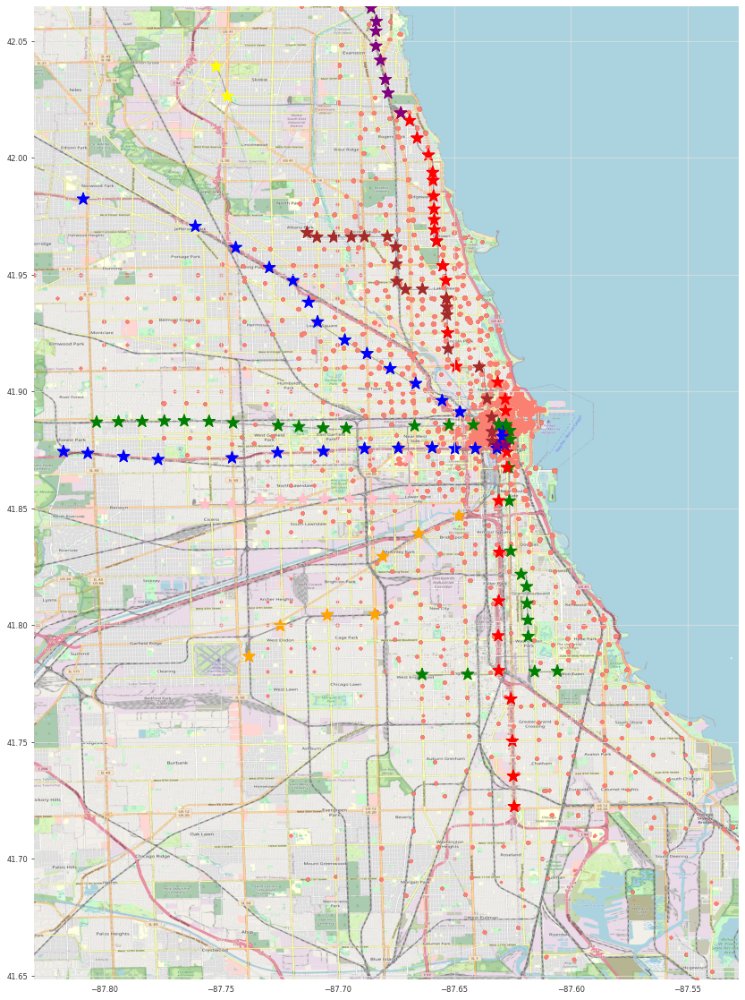

In [ ]:
plot_map(df_2020s.start_lat, df_2020s.start_lgt, L=True)

We see that most bikes are being used in the downtown loop area. We will focus on this region for analysis, restricting the coordinates to <br> `41.9 to 41.87`, `-87.65 to -87.1`

In [ ]:
chi_dt = df_2020s.loc[(df_2020s.start_lat < 41.9) & (df_2020s.start_lat > 41.87) & (df_2020s.start_lgt > -87.65) & (df_2020s.start_lgt < -87.1)][["start_lat","start_lgt"]]

# of tiles to be downloaded 64
41.89999983333333 41.87001516666667 -87.61138033333333 -87.6499885


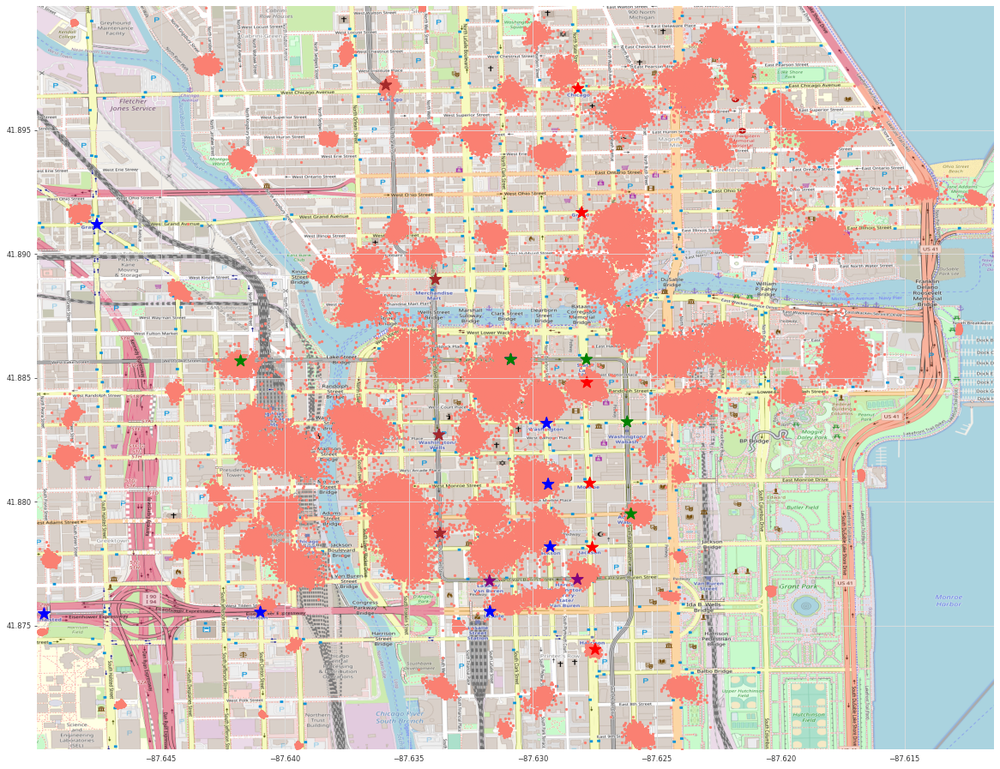

In [ ]:
plot_map(chi_dt.start_lat, chi_dt.start_lgt, zoom=16, L=True)

Seems that most L stations in the downtown area by the loop have a lot of bike stations around it which seems to be in line with the expectation that the L helps get to and from longer distances and Divvy bikes help with the last mile or two around the city. 

Another interesting  observation is that certain regions such as around (41.88, -87.64) have high usage of Divvy bikes while the L does not have stations serving that area. Upon closer inspection, that area is home to two transportation hubs: Ogilvie and Chicago Union station. It makes sense that people riding the train to those stations will need another form of short transport into the city and since the L doesn't service that region directly, a lot of the demand for last few miles traveled can be satisfied with Divvy Bikes.

A similar pattern is at around (41.895, -87.61) and near Navy Pier and this is due to the collection of Northwestern Chicago campuses and many students that need commute to that area as well as tourists and just people trying to visit the various museums and sights along the coast but where no efficient mode of transportation is able to bridge that gap. 

## Before Pandemic (2019-2020-01-31)

In [ ]:
pre_pandemic = df.loc[df['start_time'] <= pd.Timestamp('2020-01-31')]

In [ ]:
fsc_prep = pre_pandemic.groupby('from_station_name')['from_station_name'].count().sort_values(ascending=False)

In [ ]:
tsc_prep = pre_pandemic.groupby('to_station_name')['to_station_name'].count().sort_values(ascending=False)

In [ ]:
# Top 25 FROM stations
fsc_prep.head(25)

from_station_name
Streeter Dr & Grand Ave                68378
Canal St & Adams St                    57502
Clinton St & Madison St                52662
Clinton St & Washington Blvd           50479
Lake Shore Dr & Monroe St              50139
Columbus Dr & Randolph St              40797
Michigan Ave & Washington St           39054
Michigan Ave & Oak St                  35762
Franklin St & Monroe St                35687
Daley Center Plaza                     35167
Kingsbury St & Kinzie St               34930
Millennium Park                        34673
Lake Shore Dr & North Blvd             34634
Theater on the Lake                    32165
Canal St & Madison St                  31290
Shedd Aquarium                         26743
LaSalle St & Jackson Blvd              26638
Clark St & Elm St                      26569
Wabash Ave & Grand Ave                 25466
Dearborn St & Erie St                  25258
Wells St & Huron St                    25230
Orleans St & Merchandise Mart Plaza  

# of tiles to be downloaded 32


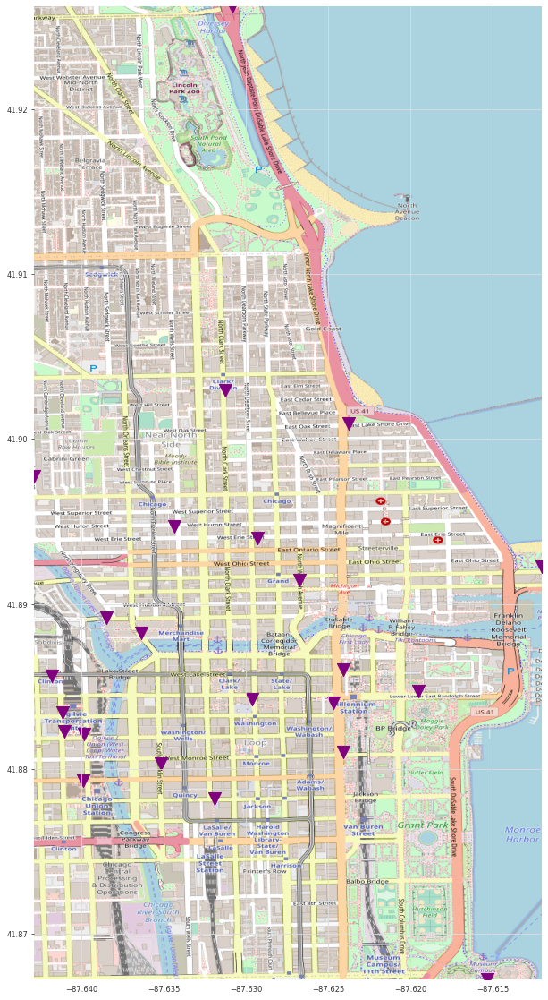

In [ ]:
show_locs(fsc_prep.head(25), zoom=15)

In [ ]:
# Top 25 TO stations
tsc_prep.head(25)

to_station_name
Streeter Dr & Grand Ave         82170
Clinton St & Washington Blvd    53433
Canal St & Adams St             53359
Clinton St & Madison St         50105
Lake Shore Dr & North Blvd      42624
Michigan Ave & Washington St    41955
Lake Shore Dr & Monroe St       40906
Michigan Ave & Oak St           38197
Millennium Park                 38096
Theater on the Lake             36110
Daley Center Plaza              34389
Kingsbury St & Kinzie St        34327
Franklin St & Monroe St         30888
Canal St & Madison St           30047
Clark St & Elm St               28030
St. Clair St & Erie St          25925
Dearborn St & Erie St           25710
Wabash Ave & Grand Ave          25418
Columbus Dr & Randolph St       25074
LaSalle St & Jackson Blvd       24823
Clinton St & Lake St            24650
Larrabee St & Kingsbury St      24572
Michigan Ave & Lake St          23862
Wells St & Concord Ln           23119
Clark St & Armitage Ave         22974
Name: to_station_name, dtype: int6

# of tiles to be downloaded 24


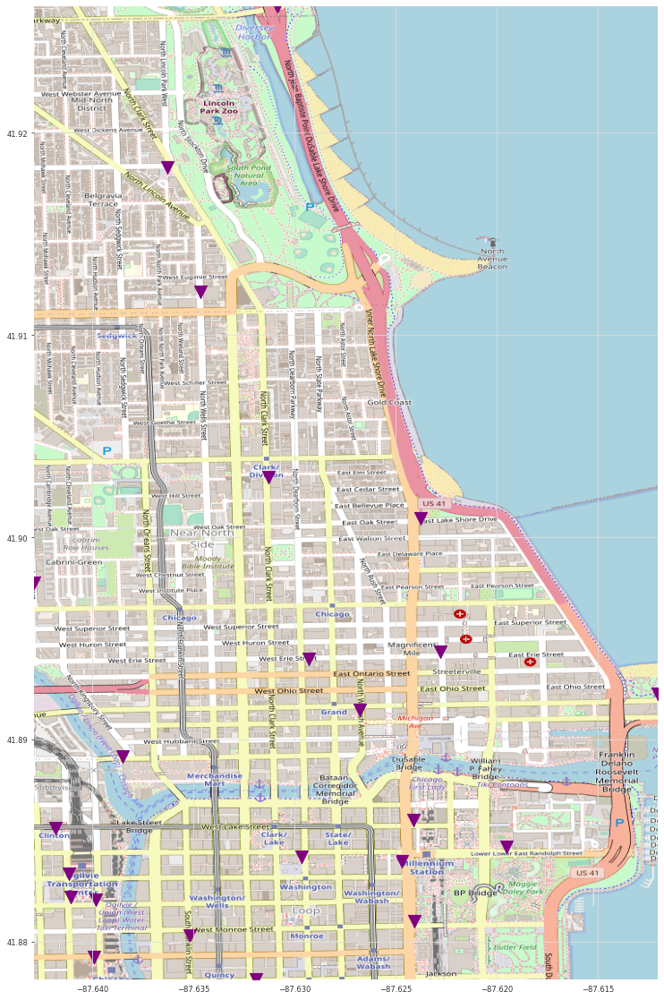

In [ ]:
show_locs(tsc_prep.head(25), zoom=15)

Observations: To/From tend to be of the same stations. From the top 25, only 3 were not both in the top 25. Specifically Top for To not for From: <br>
- St. Clair St & Erie St
- Wells St & Concord Ln
- Clark St & Armitage Ave
<br>
Top for from not for to: <br>
- Shedd Aquarium
- Wells St & Huron St
- Orleans St & Merchandise Mart Plaza

In [ ]:
# code used to compare
pd.concat([fsc_prep.head(25), tsc_prep.head(25)], axis=1)

,from_station_name,to_station_name
Streeter Dr & Grand Ave,68378.0,82170.0
Canal St & Adams St,57502.0,53359.0
Clinton St & Madison St,52662.0,50105.0
Clinton St & Washington Blvd,50479.0,53433.0
Lake Shore Dr & Monroe St,50139.0,40906.0
Columbus Dr & Randolph St,40797.0,25074.0
Michigan Ave & Washington St,39054.0,41955.0
Michigan Ave & Oak St,35762.0,38197.0
Franklin St & Monroe St,35687.0,30888.0
Daley Center Plaza,35167.0,34389.0


In [ ]:
# Bottom 25 FROM
fsc_prep.tail(25)

from_station_name
Damen Ave & 59th St                       37
Wabash Ave & 83rd St                      37
South Chicago Ave & 83rd St               37
Halsted St & 59th St                      36
May St & 69th St                          35
Calumet Ave & 71st St                     35
Cicero Ave & Flournoy St                  30
Halsted St & 51st St                      27
Stony Island Ave & South Chicago Ave      27
DIVVY Map Frame B/C Station               26
Vincennes Ave & 75th St                   23
Kostner Ave & Lake St                     21
Rhodes Ave & 71st St                      17
Seeley Ave & Garfield Blvd                17
HUBBARD ST BIKE CHECKING (LBS-WH-TEST)    16
South Chicago Ave & Elliot Ave            13
Carpenter St & 63rd St                    13
Michigan Ave & 71st St                    12
Elizabeth St & 59th St                    11
Racine Ave & 65th St                      10
Racine Ave & 61st St                       9
DIVVY CASSETTE REPAIR MOBILE STATION 

# of tiles to be downloaded 25


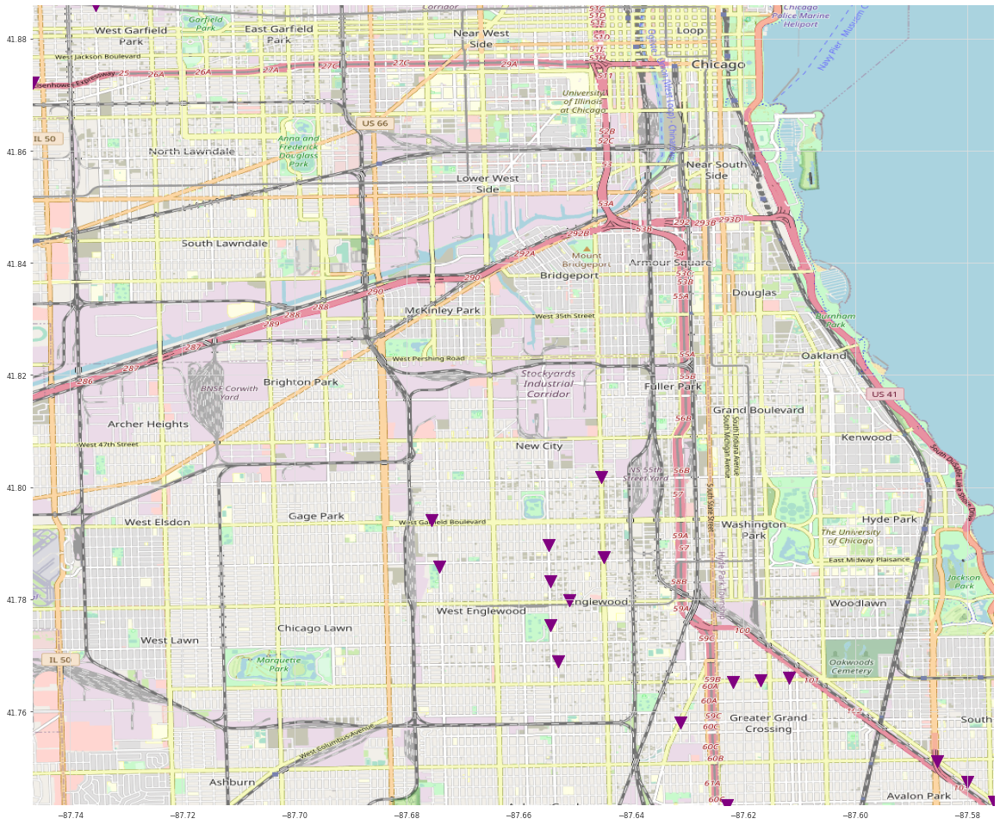

In [ ]:
show_locs(fsc_prep.tail(25))

In [ ]:
# Bottom 25 TO
tsc_prep.tail(25)

to_station_name
Kenton Ave & Madison St                 37
Wabash Ave & 83rd St                    37
Marshfield Ave & 59th St                36
Calumet Ave & 71st St                   36
South Chicago Ave & 83rd St             34
Stony Island Ave & South Chicago Ave    30
Halsted St & 59th St                    30
Halsted St & 51st St                    30
May St & 69th St                        27
Seeley Ave & Garfield Blvd              26
Cicero Ave & Flournoy St                25
Vincennes Ave & 75th St                 24
Carpenter St & 63rd St                  22
Rhodes Ave & 71st St                    21
Kostner Ave & Lake St                   18
Michigan Ave & 71st St                  16
Racine Ave & 65th St                    16
Elizabeth St & 59th St                  13
South Chicago Ave & Elliot Ave          10
Racine Ave & 61st St                     8
DIVVY CASSETTE REPAIR MOBILE STATION     5
TS ~ DIVVY PARTS TESTING                 2
Special Events                        

# of tiles to be downloaded 25


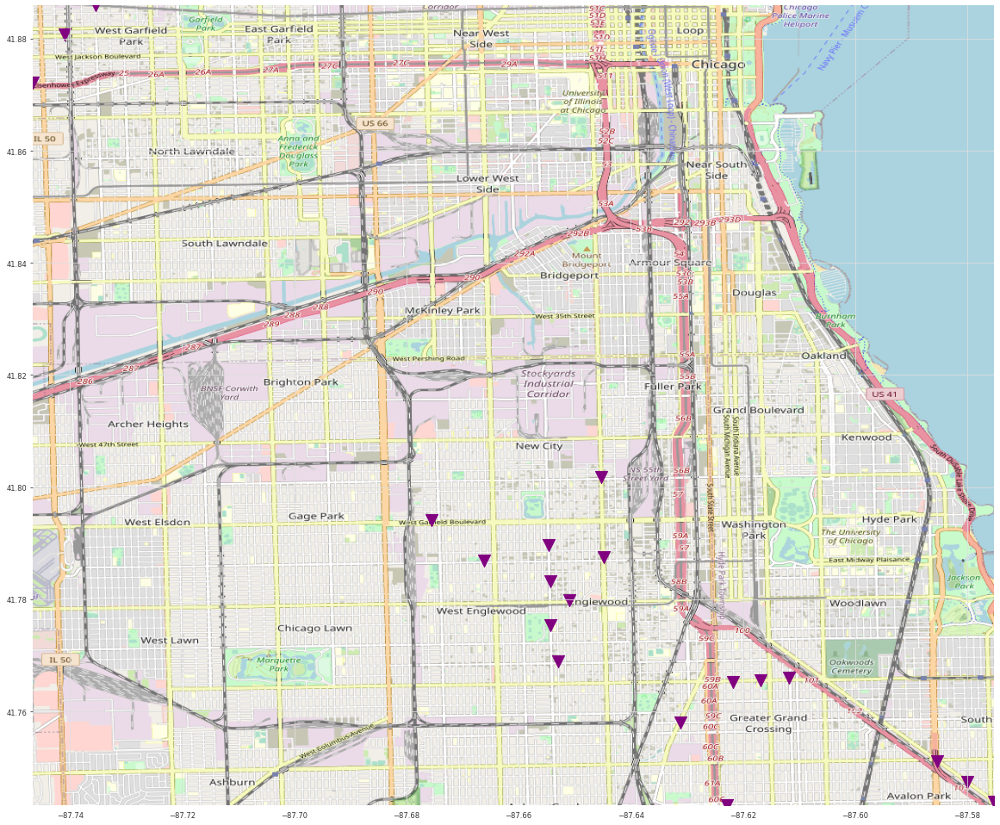

In [ ]:
show_locs(tsc_prep.tail(25))

Same pattern observed for bottom 25. 3 not the same

In [ ]:
pd.concat([fsc_prep.tail(25), tsc_prep.tail(25)], axis=1)

,from_station_name,to_station_name
Damen Ave & 59th St,37.0,NaN
Wabash Ave & 83rd St,37.0,37.0
South Chicago Ave & 83rd St,37.0,34.0
Halsted St & 59th St,36.0,30.0
May St & 69th St,35.0,27.0
Calumet Ave & 71st St,35.0,36.0
Cicero Ave & Flournoy St,30.0,25.0
Halsted St & 51st St,27.0,30.0
Stony Island Ave & South Chicago Ave,27.0,30.0
DIVVY Map Frame B/C Station,26.0,NaN


## During/Post Pandemic (2020-2021-12-31)

In [ ]:
post_pandemic = df_2020s.loc[df_2020s['start_time'] > pd.Timestamp('2020-01-31')]

In [ ]:
post_pandemic.head(10).dtypes

start_time           datetime64[ns]
end_time             datetime64[ns]
from_station_name            object
to_station_name              object
usertype                     object
bike_type                    object
start_lat                   float64
end_lat                     float64
start_lgt                   float64
end_lgt                     float64
dtype: object

In [ ]:
fsc_postp = post_pandemic.groupby('from_station_name')['from_station_name'].count().sort_values(ascending=False)
tsc_postp = post_pandemic.groupby('to_station_name')['to_station_name'].count().sort_values(ascending=False)

In [ ]:
# TOP 25 FROM
fsc_postp.head(10)

from_station_name
Streeter Dr & Grand Ave    115021
Clark St & Elm St           70153
Wells St & Concord Ln       65712
Theater on the Lake         65036
Michigan Ave & Oak St       63947
Millennium Park             63927
Wells St & Elm St           57681
Clark St & Armitage Ave     54417
Clark St & Lincoln Ave      53484
Dearborn St & Erie St       53454
Name: from_station_name, dtype: int64

# of tiles to be downloaded 60


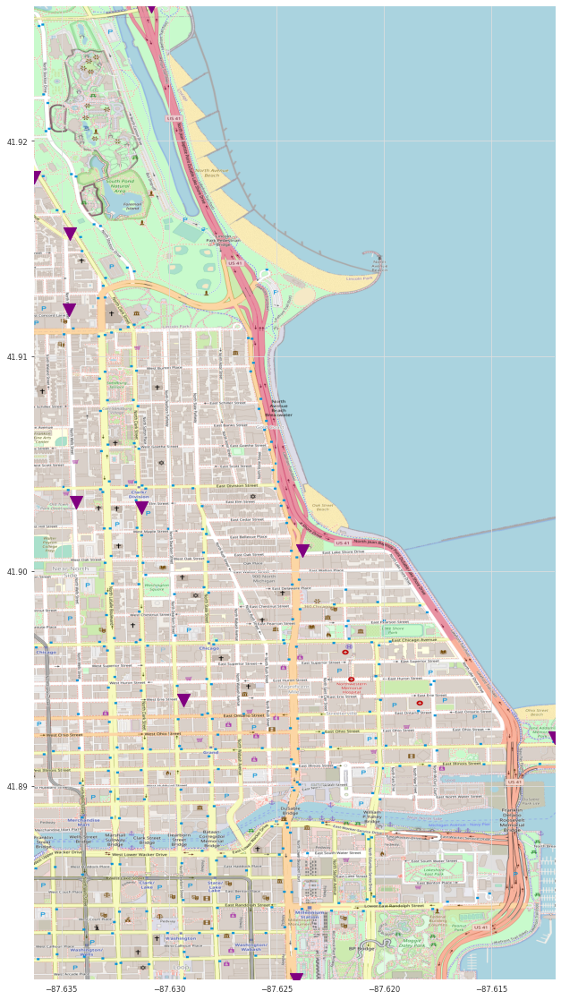

In [ ]:
show_locs(fsc_postp.head(25), zoom=15)

In [ ]:
# TOP 10 TO
tsc_postp.head(10)

to_station_name
Streeter Dr & Grand Ave    119016
Clark St & Elm St           69719
Theater on the Lake         67032
Millennium Park             66628
Wells St & Concord Ln       66517
Michigan Ave & Oak St       65262
Wells St & Elm St           56228
Dearborn St & Erie St       54546
Wabash Ave & Grand Ave      53665
Clark St & Lincoln Ave      53425
Name: to_station_name, dtype: int64

# of tiles to be downloaded 60


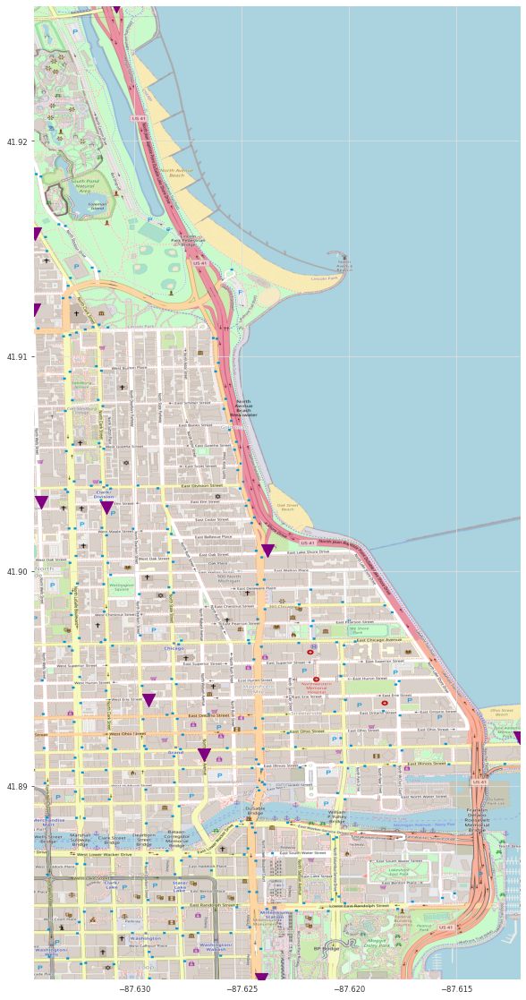

In [ ]:
show_locs(tsc_postp.head(10), zoom=16)

### Trips by hour, minute, day_of_week

In [ ]:
trips_by_hour_start_postp = post_pandemic.groupby(post_pandemic['start_time'].dt.hour)['start_time'].count()
# trips_by_hour_end_postp = post_pandemic.groupby(post_pandemic['end_time'].dt.hour)['end_time'].count()
# ^ almost same shape (which is to be expected since by hour, most trips aren't that long)

# Only weekdays trips by hour
trips_by_hour_start_postp_weekdays = post_pandemic[post_pandemic['start_time'].dt.day_of_week.isin([0,1,2,3,4])].groupby(post_pandemic['start_time'].dt.hour)['start_time'].count()
trips_by_hour_start_postp_weekends = post_pandemic[post_pandemic['start_time'].dt.day_of_week.isin([5,6])].groupby(post_pandemic['start_time'].dt.hour)['start_time'].count()

trips_by_min_start_postp = post_pandemic.groupby(post_pandemic['start_time'].dt.minute)['start_time'].count()

trips_by_dow_start_postp = post_pandemic.groupby(post_pandemic['start_time'].dt.day_of_week)['start_time'].count()

trips_by_month_start_postp = post_pandemic.groupby(post_pandemic['start_time'].dt.month)['start_time'].count()

trips_by_woy_start_postp = post_pandemic.groupby(post_pandemic['start_time'].dt.isocalendar().week)['start_time'].count()

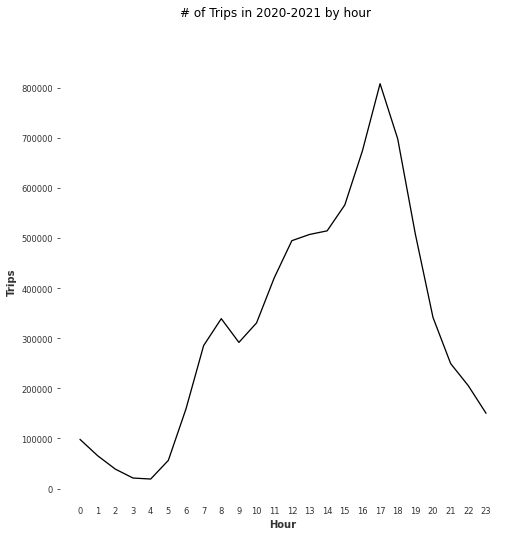

In [ ]:
splot(range(24), trips_by_hour_start_postp, "Hour", "Trips", "# of Trips in 2020-2021 by hour")

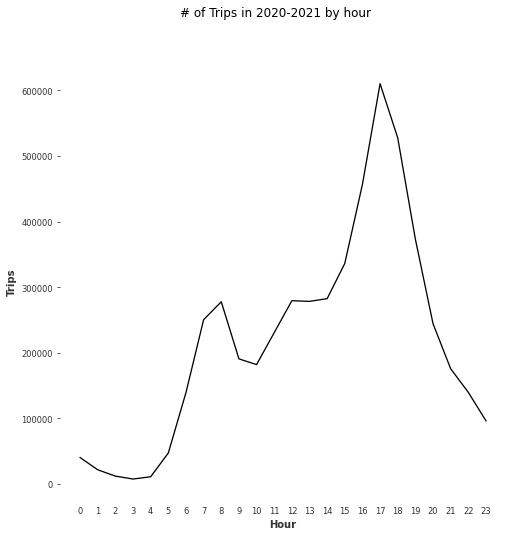

In [ ]:
splot(range(24), trips_by_hour_start_postp_weekdays, "Hour", "Trips", "# of Trips in 2020-2021 by hour")

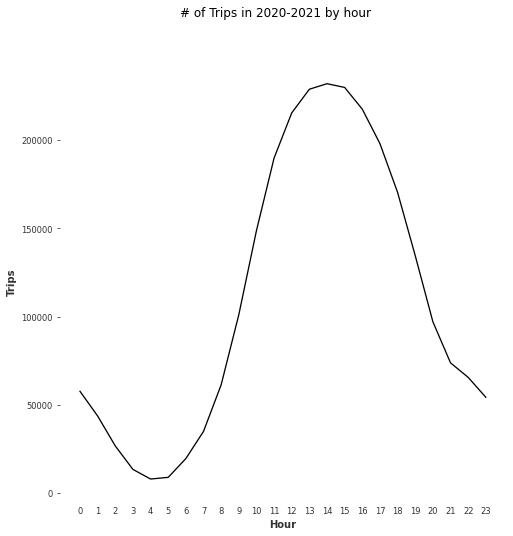

In [ ]:
splot(range(24), trips_by_hour_start_postp_weekends, "Hour", "Trips", "# of Trips in 2020-2021 by hour")

Observation: over twice as many people ride in the afternoon than morning rush hour. The spike at 5pm is reasonable since it is when most people get off work. However the morning spike at 8am isn't nearly as significant which begs the question, why are people using Divvy bikes more at times where people get just get off work than getting *to* work?

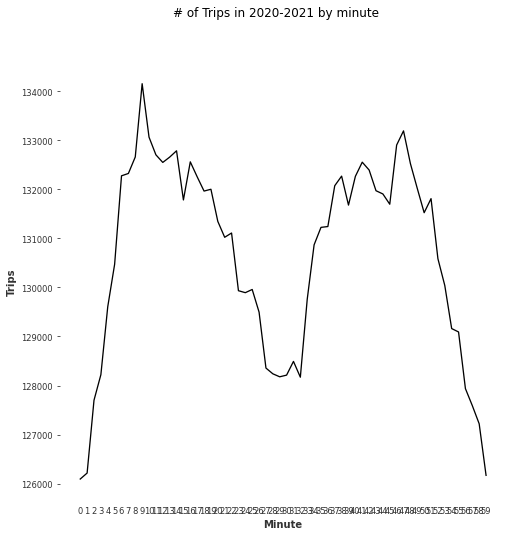

In [ ]:
splot(range(60), trips_by_min_start_postp, "Minute", "Trips", "# of Trips in 2020-2021 by minute")

By minute, it seems more people use bikes at the beginning of the hour and towards the end rather than in the middle. My explanation is that most people plan to do things at exact time intervals (e.g. at 4pm, at 9am) and les so at half hour intervals.

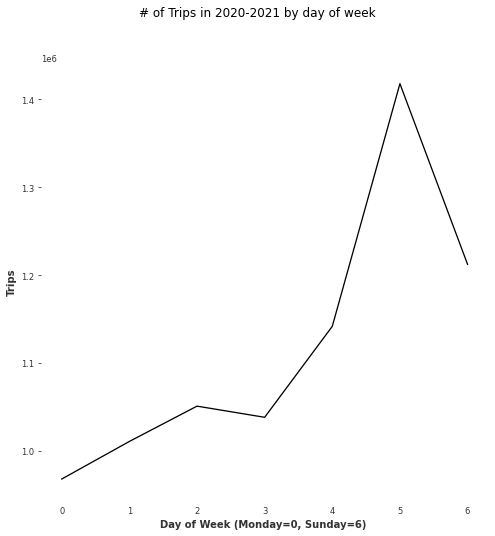

In [ ]:
splot(range(7), trips_by_dow_start_postp, "Day of Week (Monday=0, Sunday=6) ", "Trips", "# of Trips in 2020-2021 by day of week")

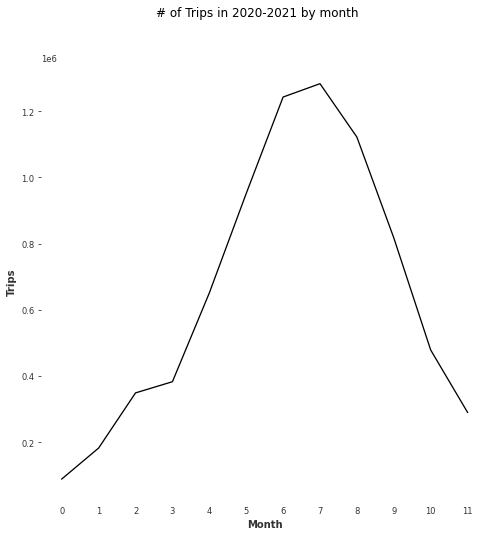

In [ ]:
splot(range(12), trips_by_month_start_postp, "Month", "Trips", "# of Trips in 2020-2021 by month")

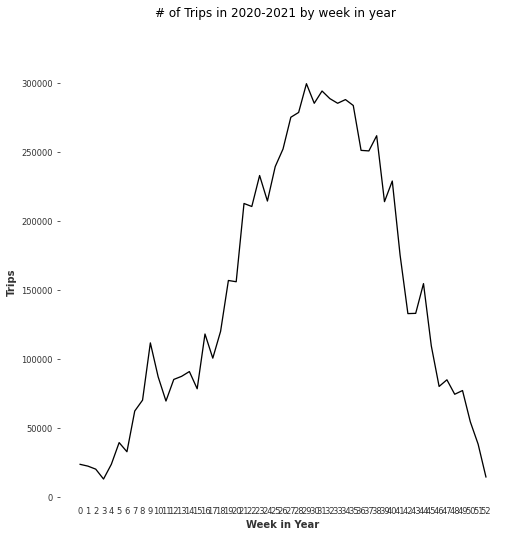

In [ ]:
splot(range(53), trips_by_woy_start_postp, "Week in Year", "Trips", "# of Trips in 2020-2021 by week in year")

## NU Specific

In [ ]:
# IDK HOW, and no time

# MISC Facts

## Station with least and most member users by percentage (stations with most and least loyal users)

In [ ]:
post_pandemic.head()

,start_time,end_time,from_station_name,to_station_name,usertype,bike_type,start_lat,end_lat,start_lgt,end_lgt
8,2020-01-31 16:37:16,2020-01-31 16:42:11,Wells St & Hubbard St,Desplaines St & Randolph St,member,docked_bike,41.8899,41.8846,-87.6343,-87.6446
9,2020-01-31 09:39:17,2020-01-31 09:42:40,Clark St & Lake St,Orleans St & Merchandise Mart Plaza,member,docked_bike,41.8860,41.8882,-87.6309,-87.6364
49,2020-01-31 16:59:56,2020-01-31 17:10:26,California Ave & Montrose Ave,California Ave & Fletcher St,member,docked_bike,41.9611,41.9384,-87.6954,-87.6980
59,2020-01-31 14:44:34,2020-01-31 14:51:24,Franklin St & Monroe St,Columbus Dr & Randolph St,member,docked_bike,41.8803,41.8847,-87.6352,-87.6195
122,2020-01-31 21:13:09,2020-01-31 21:28:52,Western Ave & Fillmore St (*),Ashland Ave & 13th St,member,docked_bike,41.8686,41.8652,-87.6862,-87.6665


In [ ]:
# omg what a save: https://stackoverflow.com/questions/60140400/pandas-group-by-and-calculate-ratio-of-two-columns
member_ratio = post_pandemic.groupby("from_station_name")["usertype"].value_counts(normalize=True).mul(100)
# member_ratio = post_pandemic.groupby(['from_station_name', 'usertype'])

In [ ]:
# TOP K stations with most percentage of "member riders" (loyal stations)
member_ratio.unstack()['member'].sort_values(ascending=False).head(50)

from_station_name
N Hampden Ct & W Diversey Ave         100.000000
Lyft Driver Center Private Rack       100.000000
Sacramento Blvd & Polk St             100.000000
Throop/Hastings Mobile Station        100.000000
Sacramento Ave & 25th St              100.000000
Eggleston Ave & 69th St (*)           100.000000
N Shore Channel Trail & Argyle Ave    100.000000
Western Ave & Fillmore St (*)          96.727273
Leavitt St & Division St (*)           94.952681
Racine Ave & Washington Blvd (*)       94.647202
Base - 2132 W Hubbard Warehouse        94.413408
Wood St & Chicago Ave (*)              92.201835
Damen Ave & Walnut (Lake) St (*)       91.735537
Leavitt St & Belmont Ave (*)           90.573770
Kedzie Ave & George St                 87.755102
Francisco Ave & Bloomingdale Ave       87.500000
Wood St & Taylor St                    86.945946
Wood St & Taylor St (Temp)             86.617542
Wolcott Ave & Polk St                  85.436893
Richmond St & Lincoln Ave              84.615385
Sm

# of tiles to be downloaded 21


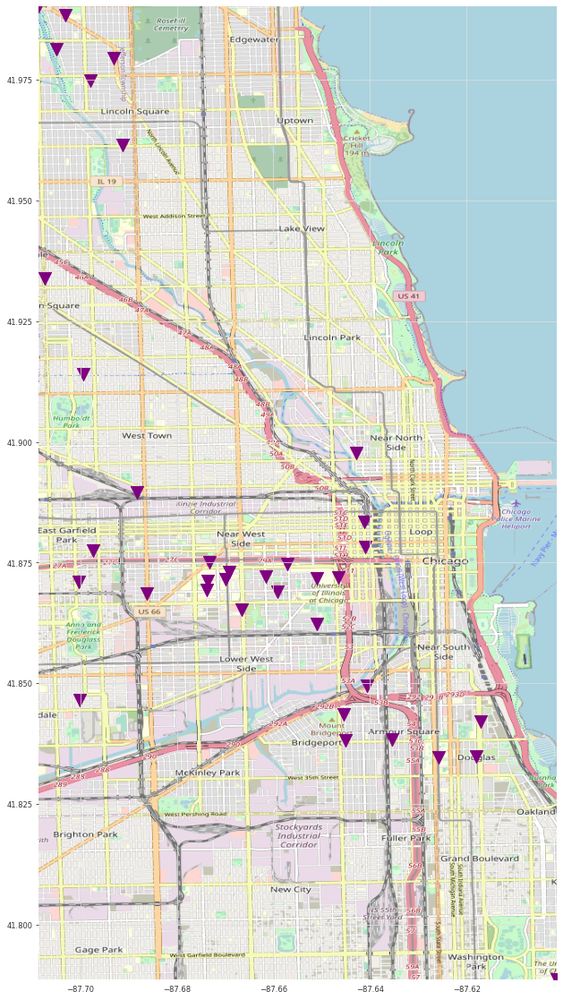

In [ ]:
show_locs(member_ratio.unstack()['member'].sort_values(ascending=False).head(50))

In [ ]:
# There are stations with no membership users, more than pure loyal stations
member_ratio.unstack()['member'].sort_values(ascending=False).tail(30)

from_station_name
Plainfield & Irving Park                1.960784
WEST CHI-WATSON                         1.219512
Vernon Ave & 107th St                   0.819672
HQ QR                                   0.026553
351                                          NaN
Artesian Ave & 55th St                       NaN
Augusta Blvd & Laramie Ave                   NaN
California Ave & 36th St                     NaN
California Ave & Marquette Rd                NaN
Campbell Ave & 51st St                       NaN
Central Park Ave & Ohio St                   NaN
Commercial Ave & 100th St                    NaN
DIVVY CASSETTE REPAIR MOBILE STATION         NaN
Hamlin Ave & 62nd Pl                         NaN
Indiana Ave & 133rd St                       NaN
Kildare Ave & 47th St                        NaN
Kildare Ave & 55th St                        NaN
Komensky Ave & 55th St                       NaN
Lamon Ave & Chicago Ave                      NaN
Leamington Ave & Hirsch St                   NaN
Ok

In [ ]:
# sanity check
assert len(member_ratio.unstack()['member'].sort_values(ascending=False)) == len(member_ratio.unstack()['casual'].sort_values(ascending=False))

In [ ]:
# TOP K stations with most percentage of "casual riders" (non-loyal stations)
member_ratio.unstack()['casual'].sort_values(ascending=False).head(50)

from_station_name
hubbard_test_lws                        100.000000
Campbell Ave & 51st St                  100.000000
Augusta Blvd & Laramie Ave              100.000000
Tripp Ave & 65th St                     100.000000
Kildare Ave & 47th St                   100.000000
Kildare Ave & 55th St                   100.000000
California Ave & 36th St                100.000000
St Louis Ave & Norman Bobbins Ave       100.000000
California Ave & Marquette Rd           100.000000
Komensky Ave & 55th St                  100.000000
S Wentworth Ave & W 111th St            100.000000
351                                     100.000000
Indiana Ave & 133rd St                  100.000000
Lamon Ave & Chicago Ave                 100.000000
Rockwell St & 57th St                   100.000000
Central Park Ave & Ohio St              100.000000
Leamington Ave & Hirsch St              100.000000
Parkside Ave & Armitage Ave             100.000000
Olive Harvey College                    100.000000
Oketo Ave & A

In [ ]:
# There exists stations with no casual riders (all member)
member_ratio.unstack()['casual'].sort_values(ascending=False).tail(10)

from_station_name
Racine Ave & Washington Blvd (*)      5.352798
Leavitt St & Division St (*)          5.047319
Western Ave & Fillmore St (*)         3.272727
Eggleston Ave & 69th St (*)                NaN
Lyft Driver Center Private Rack            NaN
N Hampden Ct & W Diversey Ave              NaN
N Shore Channel Trail & Argyle Ave         NaN
Sacramento Ave & 25th St                   NaN
Sacramento Blvd & Polk St                  NaN
Throop/Hastings Mobile Station             NaN
Name: casual, dtype: float64

# of tiles to be downloaded 70


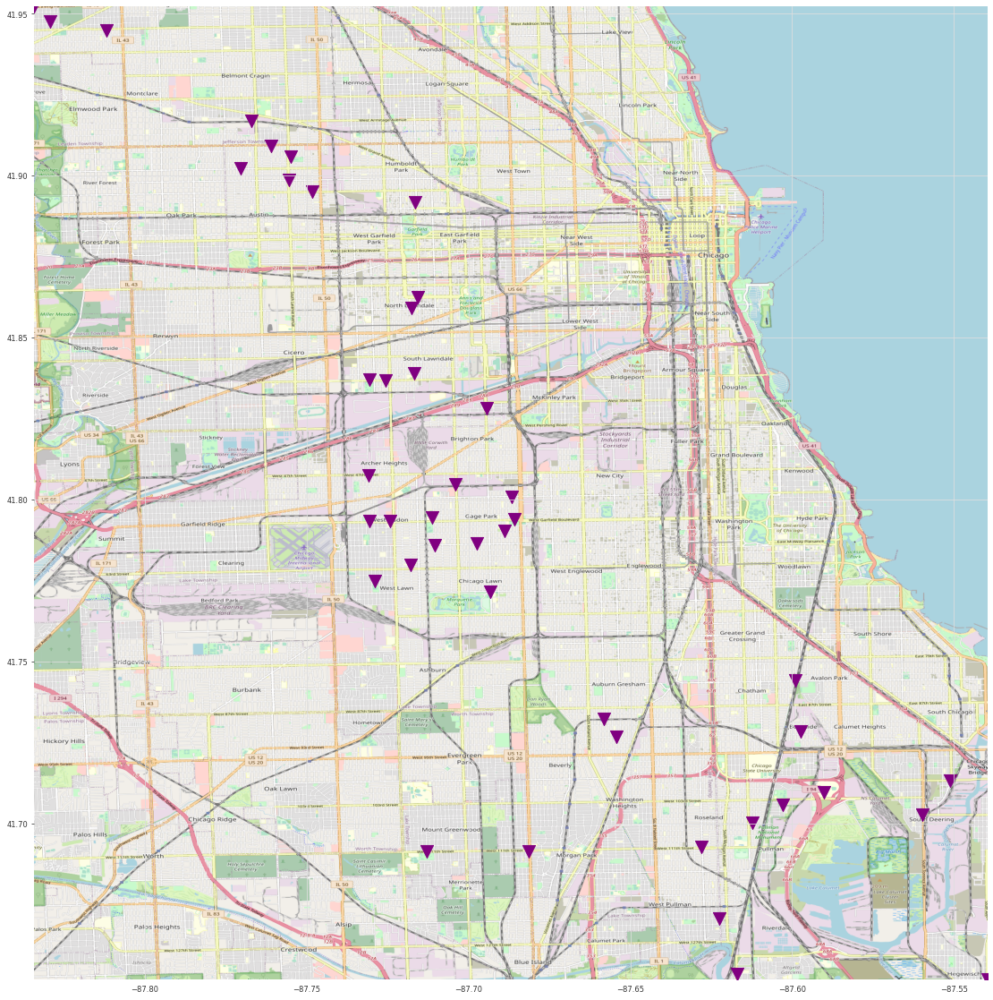

In [ ]:
show_locs(member_ratio.unstack()['casual'].sort_values(ascending=False).head(50))

## Station with most electric bike usage (problems)

In [ ]:
biketype_ratio = post_pandemic.groupby("from_station_name")["bike_type"].value_counts(normalize=True).mul(100)
biketype_counts = post_pandemic.groupby("from_station_name")["bike_type"].value_counts()

In [ ]:
biketype_ratio

from_station_name     bike_type    
2112 W Peterson Ave   docked_bike       41.437126
                      classic_bike      34.491018
                      electric_bike     24.071856
351                   electric_bike    100.000000
63rd St Beach         docked_bike       62.471655
                                          ...    
Yates Blvd & 75th St  electric_bike      9.271523
Yates Blvd & 93rd St  electric_bike     72.500000
                      classic_bike      25.000000
                      docked_bike        2.500000
hubbard_test_lws      electric_bike    100.000000
Name: bike_type, Length: 2247, dtype: float64

In [ ]:
biketype_counts

from_station_name     bike_type    
2112 W Peterson Ave   docked_bike       692
                      classic_bike      576
                      electric_bike     402
351                   electric_bike       1
63rd St Beach         docked_bike      2755
                                       ... 
Yates Blvd & 75th St  electric_bike      42
Yates Blvd & 93rd St  electric_bike      58
                      classic_bike       20
                      docked_bike         2
hubbard_test_lws      electric_bike       1
Name: bike_type, Length: 2247, dtype: int64

In [ ]:
# by raw
post_pandemic.groupby('to_station_name')['bike_type'].count().sort_values(ascending=False).head(10)

to_station_name
Streeter Dr & Grand Ave    119016
Clark St & Elm St           69719
Theater on the Lake         67032
Millennium Park             66628
Wells St & Concord Ln       66517
Michigan Ave & Oak St       65262
Wells St & Elm St           56228
Dearborn St & Erie St       54546
Wabash Ave & Grand Ave      53665
Clark St & Lincoln Ave      53425
Name: bike_type, dtype: int64

## Pre/Post pandemic stuff (forgot about)

In [ ]:
tsc_postp = post_pandemic.groupby('to_station_name')['to_station_name'].count().sort_values(ascending=False)
fsc_postp = post_pandemic.groupby('from_station_name')

In [ ]:
fsc_postp['from_station_name'].count().sort_values(ascending=False).head(25)

from_station_name
Streeter Dr & Grand Ave       115021
Clark St & Elm St              70153
Wells St & Concord Ln          65712
Theater on the Lake            65036
Michigan Ave & Oak St          63947
Millennium Park                63927
Wells St & Elm St              57681
Clark St & Armitage Ave        54417
Clark St & Lincoln Ave         53484
Dearborn St & Erie St          53454
Lake Shore Dr & Monroe St      53074
Kingsbury St & Kinzie St       52496
Wabash Ave & Grand Ave         52264
Indiana Ave & Roosevelt Rd     52052
Broadway & Barry Ave           52038
Wells St & Huron St            51469
Lake Shore Dr & North Blvd     49314
St. Clair St & Erie St         49272
Larrabee St & Webster Ave      46414
Columbus Dr & Randolph St      44921
Desplaines St & Kinzie St      44898
Michigan Ave & Lake St         44218
Fairbanks Ct & Grand Ave       43971
Wells St & Evergreen Ave       43943
Wilton Ave & Belmont Ave       43631
Name: from_station_name, dtype: int64

In [ ]:
fsc_postp['from_station_name'].count().sort_values(ascending=False).head(25)

from_station_name
Streeter Dr & Grand Ave       115021
Clark St & Elm St              70153
Wells St & Concord Ln          65712
Theater on the Lake            65036
Michigan Ave & Oak St          63947
Millennium Park                63927
Wells St & Elm St              57681
Clark St & Armitage Ave        54417
Clark St & Lincoln Ave         53484
Dearborn St & Erie St          53454
Lake Shore Dr & Monroe St      53074
Kingsbury St & Kinzie St       52496
Wabash Ave & Grand Ave         52264
Indiana Ave & Roosevelt Rd     52052
Broadway & Barry Ave           52038
Wells St & Huron St            51469
Lake Shore Dr & North Blvd     49314
St. Clair St & Erie St         49272
Larrabee St & Webster Ave      46414
Columbus Dr & Randolph St      44921
Desplaines St & Kinzie St      44898
Michigan Ave & Lake St         44218
Fairbanks Ct & Grand Ave       43971
Wells St & Evergreen Ave       43943
Wilton Ave & Belmont Ave       43631
Name: from_station_name, dtype: int64

In [ ]:
fsc_postp.head(25)

,start_time,end_time,from_station_name,to_station_name,usertype,bike_type,start_lat,end_lat,start_lgt,end_lgt
8,2020-01-31 16:37:16,2020-01-31 16:42:11,Wells St & Hubbard St,Desplaines St & Randolph St,member,docked_bike,41.8899,41.884600,-87.6343,-87.644600
9,2020-01-31 09:39:17,2020-01-31 09:42:40,Clark St & Lake St,Orleans St & Merchandise Mart Plaza,member,docked_bike,41.8860,41.888200,-87.6309,-87.636400
49,2020-01-31 16:59:56,2020-01-31 17:10:26,California Ave & Montrose Ave,California Ave & Fletcher St,member,docked_bike,41.9611,41.938400,-87.6954,-87.698000
59,2020-01-31 14:44:34,2020-01-31 14:51:24,Franklin St & Monroe St,Columbus Dr & Randolph St,member,docked_bike,41.8803,41.884700,-87.6352,-87.619500
122,2020-01-31 21:13:09,2020-01-31 21:28:52,Western Ave & Fillmore St (*),Ashland Ave & 13th St,member,docked_bike,41.8686,41.865200,-87.6862,-87.666500
...,...,...,...,...,...,...,...,...,...,...
7965104,2021-11-03 08:12:54,2021-11-03 08:14:43,California Ave & Marquette Rd,California Ave & Marquette Rd,casual,electric_bike,41.7700,41.770000,-87.6900,-87.690000
7965712,2021-11-22 21:53:43,2021-11-22 21:54:22,Western Ave & 62nd St,Western Ave & 62nd St,member,electric_bike,41.7800,41.780000,-87.6800,-87.680000
7968029,2021-11-17 15:25:55,2021-11-17 15:59:43,Rockwell St & Cermak Rd,Kedzie Ave & Milwaukee Ave,casual,electric_bike,41.8500,41.929518,-87.6900,-87.707832
7970876,2021-11-24 22:23:29,2021-11-24 22:28:07,Francisco Ave & Montrose Ave,Rockwell St & Eastwood Ave,member,electric_bike,41.9600,41.965692,-87.7000,-87.693754


In [ ]:
fsc_postp.tail(25)

,start_time,end_time,from_station_name,to_station_name,usertype,bike_type,start_lat,end_lat,start_lgt,end_lgt
186274,2020-02-14 12:16:53,2020-02-14 12:20:31,MTL-ECO5.1-01,MTL-ECO5.1-01,casual,docked_bike,41.917100,41.917100,-87.748200,-87.748200
225330,2020-02-12 07:49:45,2020-02-12 07:49:57,MTL-ECO5.1-01,MTL-ECO5.1-01,casual,docked_bike,41.917100,41.917100,-87.748200,-87.748200
235949,2020-02-21 19:34:56,2020-02-21 20:05:39,Eggleston Ave & 69th St (*),Lake Park Ave & 53rd St,member,docked_bike,41.768900,41.799500,-87.635900,-87.586500
293291,2020-03-05 15:10:41,2020-03-05 15:13:54,MTL-ECO5.1-01,MTL-ECO5.1-01,member,docked_bike,41.917100,41.917100,-87.748200,-87.748200
335757,2020-03-12 13:33:10,2020-03-12 13:58:09,Stewart Ave & 63rd St (*),Stewart Ave & 63rd St (*),member,docked_bike,41.779800,41.779800,-87.634800,-87.634800
...,...,...,...,...,...,...,...,...,...,...
7978550,2021-11-02 13:50:48,2021-11-02 13:55:11,Green St & Randolph St,Kingsbury St & Kinzie St,member,electric_bike,41.883510,41.889181,-87.648568,-87.638859
7978551,2021-11-03 17:28:57,2021-11-03 17:45:13,Elston Ave & Cortland St,Wells St & Walton St,casual,classic_bike,41.916433,41.899930,-87.666746,-87.634430
7978552,2021-11-07 11:55:24,2021-11-07 12:05:54,Desplaines St & Randolph St,Aberdeen St & Jackson Blvd,casual,docked_bike,41.884616,41.877726,-87.644571,-87.654787
7978553,2021-11-22 18:03:27,2021-11-22 18:06:36,Ogden Ave & Chicago Ave,Desplaines St & Kinzie St,member,electric_bike,41.896442,41.888691,-87.653998,-87.644465


In [ ]:
pd.concat([fsc_postp.head(25), tsc_postp.head(25)], axis=1)

,start_time,end_time,from_station_name,to_station_name,usertype,bike_type,start_lat,end_lat,start_lgt,end_lgt,to_station_name
8,2020-01-31 16:37:16,2020-01-31 16:42:11,Wells St & Hubbard St,Desplaines St & Randolph St,member,docked_bike,41.8899,41.8846,-87.6343,-87.6446,NaN
9,2020-01-31 09:39:17,2020-01-31 09:42:40,Clark St & Lake St,Orleans St & Merchandise Mart Plaza,member,docked_bike,41.8860,41.8882,-87.6309,-87.6364,NaN
49,2020-01-31 16:59:56,2020-01-31 17:10:26,California Ave & Montrose Ave,California Ave & Fletcher St,member,docked_bike,41.9611,41.9384,-87.6954,-87.6980,NaN
59,2020-01-31 14:44:34,2020-01-31 14:51:24,Franklin St & Monroe St,Columbus Dr & Randolph St,member,docked_bike,41.8803,41.8847,-87.6352,-87.6195,NaN
122,2020-01-31 21:13:09,2020-01-31 21:28:52,Western Ave & Fillmore St (*),Ashland Ave & 13th St,member,docked_bike,41.8686,41.8652,-87.6862,-87.6665,NaN
...,...,...,...,...,...,...,...,...,...,...,...
Wells St & Concord Ln,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,66517.0
Wells St & Elm St,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56228.0
Wells St & Evergreen Ave,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,43623.0
Wells St & Huron St,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,49630.0


In [ ]:
# Bottom 25
pd.concat([fsc_postp.tail(25), tsc_postp.tail(25)], axis=1)

,start_time,end_time,from_station_name,to_station_name,usertype,bike_type,start_lat,end_lat,start_lgt,end_lgt,to_station_name
186274,2020-02-14 12:16:53,2020-02-14 12:20:31,MTL-ECO5.1-01,MTL-ECO5.1-01,casual,docked_bike,41.9171,41.9171,-87.7482,-87.7482,NaN
225330,2020-02-12 07:49:45,2020-02-12 07:49:57,MTL-ECO5.1-01,MTL-ECO5.1-01,casual,docked_bike,41.9171,41.9171,-87.7482,-87.7482,NaN
235949,2020-02-21 19:34:56,2020-02-21 20:05:39,Eggleston Ave & 69th St (*),Lake Park Ave & 53rd St,member,docked_bike,41.7689,41.7995,-87.6359,-87.5865,NaN
293291,2020-03-05 15:10:41,2020-03-05 15:13:54,MTL-ECO5.1-01,MTL-ECO5.1-01,member,docked_bike,41.9171,41.9171,-87.7482,-87.7482,NaN
335757,2020-03-12 13:33:10,2020-03-12 13:58:09,Stewart Ave & 63rd St (*),Stewart Ave & 63rd St (*),member,docked_bike,41.7798,41.7798,-87.6348,-87.6348,NaN
...,...,...,...,...,...,...,...,...,...,...,...
Washtenaw Ave & Peterson Ave,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0
Washtenaw Ave & Polk St,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
Western Ave & Ardmore Ave,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0
Western Ave & Lake St,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0


## Northwestern Divvy Station Usage

### South Campus (By Allison)

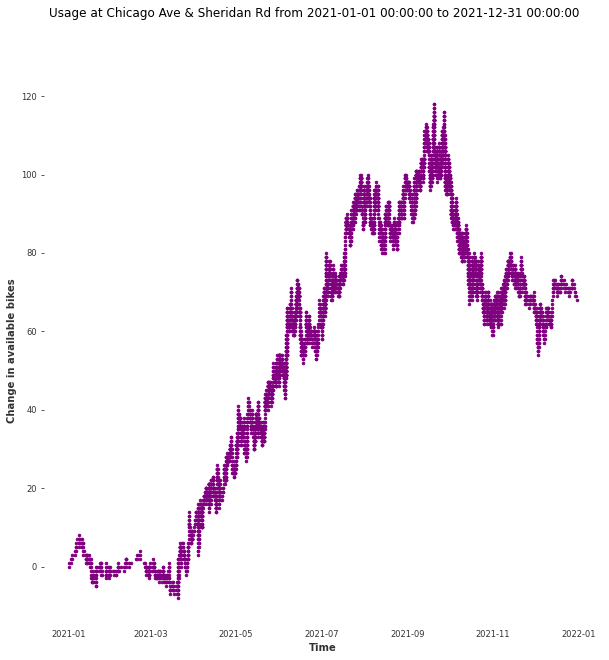

In [ ]:
_, _ = usage_history("Chicago Ave & Sheridan Rd", pd.Timestamp('2021-01-01'), pd.Timestamp('2021-12-31'), mksize=25)

### Mid Campus

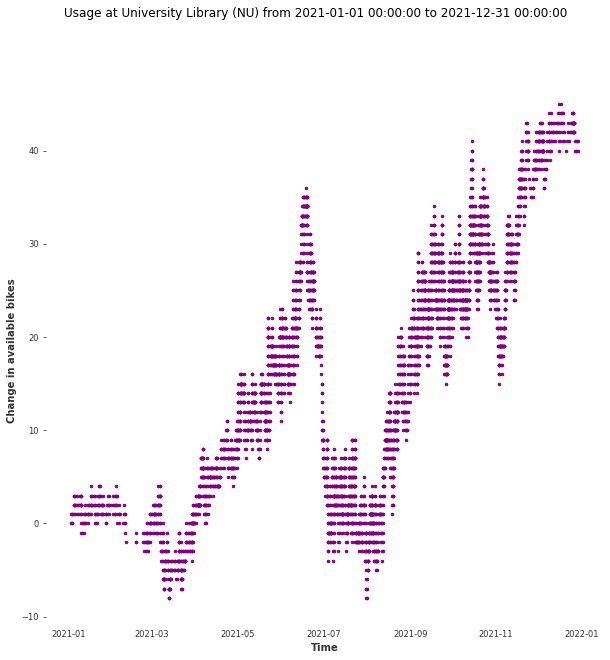

In [ ]:
_, _ = usage_history("University Library (NU)", pd.Timestamp('2021-01-01'), pd.Timestamp('2021-12-31'), mksize=25)

### North Campus

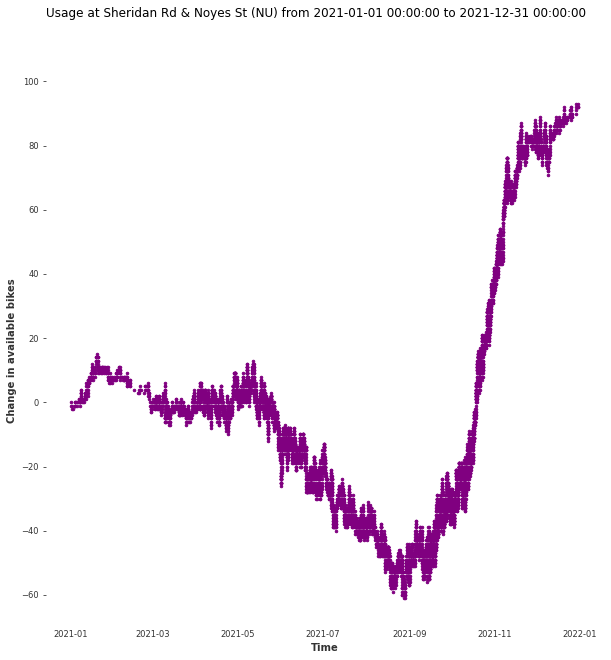

In [ ]:
_, _ = usage_history("Sheridan Rd & Noyes St (NU)", pd.Timestamp('2021-01-01'), pd.Timestamp('2021-12-31'), mksize=25)

# How might bikes be relocated to different stations to ensure more efficient usage of bikes throughout the day?

We expect a sustainable set up to have each station's net availability == 0 at the end of the day. We don't know how many bikes a station starts with, but we can see for a given day and a station, throughout time, what is the change in bike availability and if over the course of a day that == 0, over a week, over a month etc. From here we can then conclude which stations of the most used are/aren't sustainable.

We focus on top 5 FROM/TO stations and look at their bike availability throughout the day.

For a station, from_station indicates -1 availability, to_station indicates +1 availability. self loop indicates 0 availability (lol kinda like a leetcode question)

<br>

This is top 1: Streeter Dr & Grand Ave

In [ ]:
stations[stations['Station Name'] == "Streeter Dr & Grand Ave"]

,ID,Station Name,Total Docks,Docks in Service,Status,Latitude,Longitude,Location
77,35,Streeter Dr & Grand Ave,47,47,In Service,41.892278,-87.612043,"(41.892278, -87.612043)"


In [ ]:
post_pandemic.head()

,start_time,end_time,from_station_name,to_station_name,usertype,bike_type,start_lat,end_lat,start_lgt,end_lgt
8,2020-01-31 16:37:16,2020-01-31 16:42:11,Wells St & Hubbard St,Desplaines St & Randolph St,member,docked_bike,41.8899,41.8846,-87.6343,-87.6446
9,2020-01-31 09:39:17,2020-01-31 09:42:40,Clark St & Lake St,Orleans St & Merchandise Mart Plaza,member,docked_bike,41.8860,41.8882,-87.6309,-87.6364
49,2020-01-31 16:59:56,2020-01-31 17:10:26,California Ave & Montrose Ave,California Ave & Fletcher St,member,docked_bike,41.9611,41.9384,-87.6954,-87.6980
59,2020-01-31 14:44:34,2020-01-31 14:51:24,Franklin St & Monroe St,Columbus Dr & Randolph St,member,docked_bike,41.8803,41.8847,-87.6352,-87.6195
122,2020-01-31 21:13:09,2020-01-31 21:28:52,Western Ave & Fillmore St (*),Ashland Ave & 13th St,member,docked_bike,41.8686,41.8652,-87.6862,-87.6665


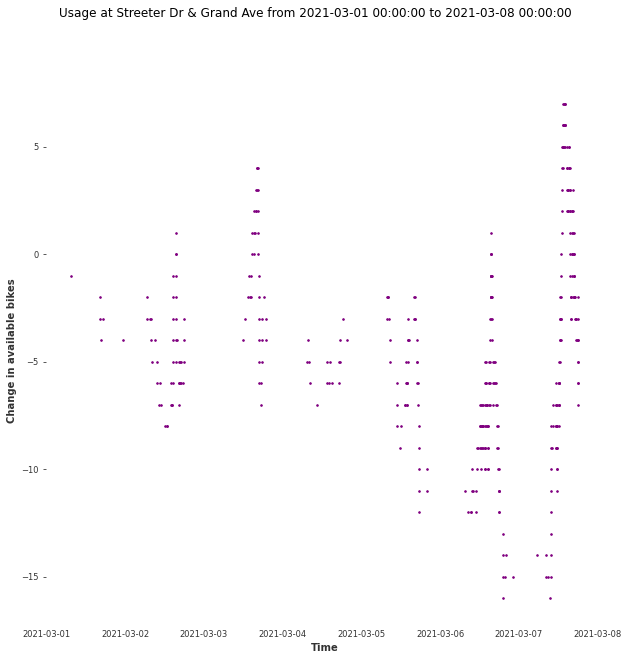

In [ ]:
_, _ = usage_history("Streeter Dr & Grand Ave", pd.Timestamp('2021-03-01'), pd.Timestamp('2021-03-08'))

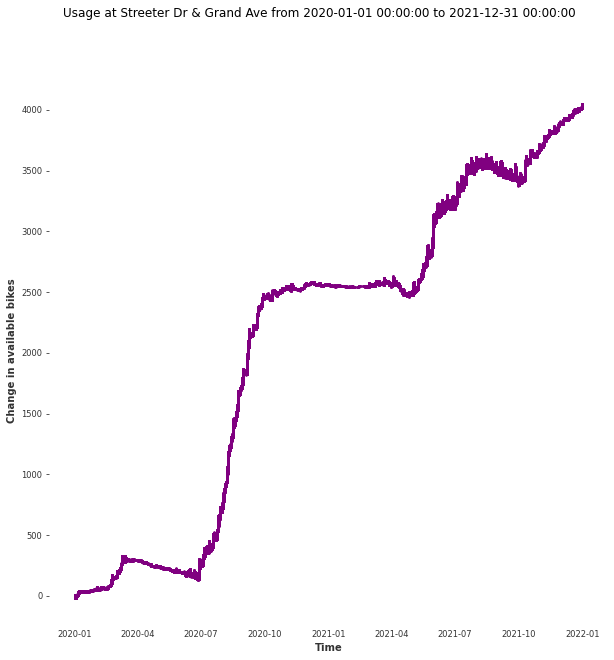

In [ ]:
_, _ = usage_history("Streeter Dr & Grand Ave", pd.Timestamp('2020-01-01'), pd.Timestamp('2021-12-31'))

What does this tell us about bike usage at "Streeter Dr & Grand Ave" station? It's impossible that after X amount of time the change in available bikes to be +- number of docks at the station which in this case is 47. So how can we explain the explosion in available bikes at "Streeter Dr & Grand Ave"? The answer is that more people go to "Streeter Dr & Grand Ave" than other stations. On a longer time scale, the station is attracting bikes from other stations to it and therefore, Divvy personnel must *remove* bikes from the station to keep it from overflowing. There may be some ratio between available bikes and available docks at each station that should maximize usage for a given season/week/day/time of the day. It would be an interesting investigation into what the optimal algorithm is to determine such a balance and this could possible be done with the data available at hand.

Streeter Dr & Grand Ave station is the station at Navy Pier, a very popular destination for Chicagoans. Therefore this explains why this particular stations receives so much end trips rather than start trips, resulting in this large net positive bikes availability. Also due to the alleviation of COVID restrictions, people are going out more and more and therefore the trend of increasing bike availability. 

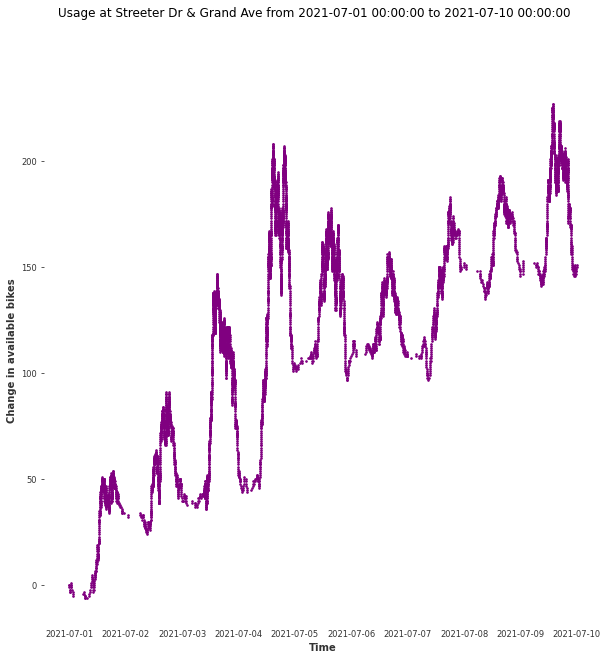

In [ ]:
_, _ = usage_history("Streeter Dr & Grand Ave", pd.Timestamp('2021-07-01'), pd.Timestamp('2021-07-10'),mksize=10)

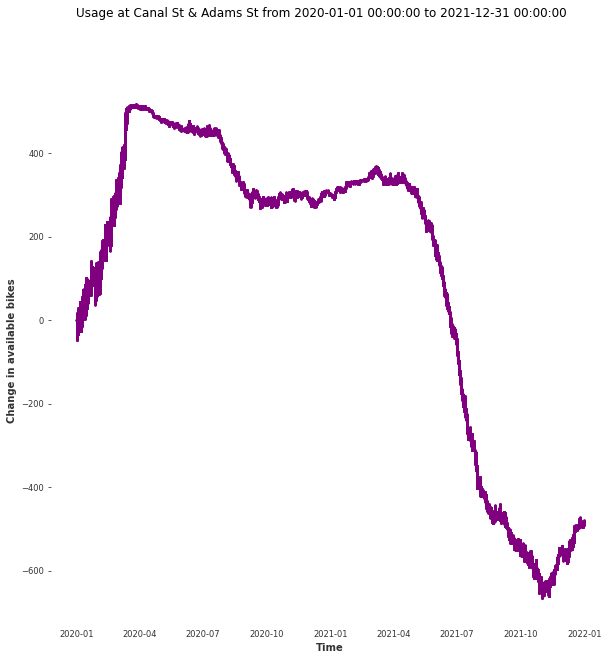

In [ ]:
_, _ = usage_history("Canal St & Adams St", pd.Timestamp('2020-01-01'), pd.Timestamp('2021-12-31'))

Plotting Canal St & Adams St, another popular station with both very high start and end trips. But this station showed an unusual trend of change in available bikes. Starting from the pandemic, the bike availability increased a lot, and  a COVID restrictions were lifted, bike returned to being net negative. This may be becasue people are staying home more and more around this urban residential area.

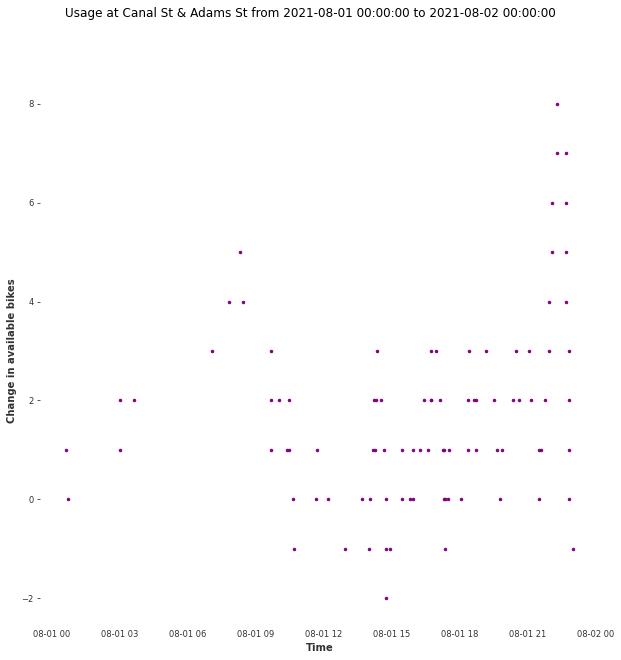

In [ ]:
xs, delta = usage_history("Canal St & Adams St", pd.Timestamp('2021-08-01'), pd.Timestamp('2021-08-02'), mksize=25)

# Forecasting Demand at a particular station (using Darts)

### Forecasting Motivation
Train over only 1 day windows' cumsums because want to learn daily patterns.
Thus forecasting *should* just be of the next day (but we'll allow multiple days in the future)

In [ ]:
# https://stackoverflow.com/questions/1060279/iterating-through-a-range-of-dates-in-python
def delta1day(station, start, end):
    for start in pd.date_range(start, end):
        end = start + pd.Timedelta(days=1)
        _, delta = usage_history(station, start, end, suppress=True)
        yield TimeSeries.from_values(np.cumsum(delta))

## Models

In [ ]:
model_interpretable = NBEATSModel(
        input_chunk_length=30,
        output_chunk_length=7,
        generic_architecture=False, #we use interpretable model to get trend and seasonality
        num_blocks=3,
        num_layers=4,
        layer_widths=512,
        n_epochs=50,
        nr_epochs_val_period=1,
        # batch_size=800,
        model_name="nbeats_interpretable_run",
    )

model_milk = NBEATSModel(input_chunk_length=24, output_chunk_length=12, n_epochs=50)

In [ ]:
# plot demand forecasting. Currently only supports NBEATS forecasting with fixed parameters
def plot_forecast(model, start: pd.Timestamp, end: pd.Timestamp, station, forecast_horizon=1):
    """
    assumes start, end, split_days are valid. trains over 1 day windows of station and forecast horizon 
    over end - split days (assuming is valid) in one go starting from last train day onwards.

    [start-------split---end] where end-split = forecast_horizon, assuming end-split > 0
    """
    split = pd.Timedelta(forecast_horizon, unit='D')
    if forecast_horizon > 1:
        #split the get windows with the prediction side getting all of horizon in one go rather than 1day windows
        pass
    else:
        #next day forecast
        alldays = list(delta1day(station, start, end))
        mod = model.fit(alldays[:-1])
        pred_x_len = len(alldays[-1].values())
        pred = model.predict(n=pred_x_len, series=alldays[-1]) #make fit to real value size

        xranges = range(len(alldays[-2].values()), len(alldays[-2].values())+len(alldays[-1].values()))
        plt.plot(xranges, alldays[-1].values(), label="actual demand")
        plt.plot(alldays[-2].values(), label="last day's usage")
        plt.plot(xranges, pred.values(), label="prediction")
        plt.legend()
    return mod

[2022-03-12 04:25:56,450] INFO | darts.models.forecasting.torch_forecasting_model | Train dataset contains 1830 samples.
[2022-03-12 04:25:56,450] INFO | darts.models.forecasting.torch_forecasting_model | Train dataset contains 1830 samples.
[2022-03-12 04:25:56,563] INFO | darts.models.forecasting.torch_forecasting_model | Time series values are 64-bits; casting model to float64.
[2022-03-12 04:25:56,563] INFO | darts.models.forecasting.torch_forecasting_model | Time series values are 64-bits; casting model to float64.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs

  | Name      | Type       | Params
-----------------------------------------
0 | criterion | MSELoss    | 0     
1 | stacks    | ModuleList | 6.2 M 
-----------------------------------------
6.2 M     Trainable params
1.4 K     Non-trainable params
6.2 M     Total params
49.575    Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

Predicting: 58it [00:00, ?it/s]

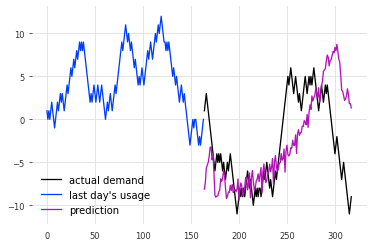

In [ ]:
res_milk = plot_forecast(model_milk, pd.Timestamp('2021-08-01'), pd.Timestamp('2021-08-11'), "Canal St & Adams St")

[2022-03-12 04:37:36,318] INFO | darts.models.forecasting.torch_forecasting_model | Train dataset contains 7560 samples.
[2022-03-12 04:37:36,318] INFO | darts.models.forecasting.torch_forecasting_model | Train dataset contains 7560 samples.
[2022-03-12 04:37:36,352] INFO | darts.models.forecasting.torch_forecasting_model | Time series values are 64-bits; casting model to float64.
[2022-03-12 04:37:36,352] INFO | darts.models.forecasting.torch_forecasting_model | Time series values are 64-bits; casting model to float64.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs

  | Name      | Type       | Params
-----------------------------------------
0 | criterion | MSELoss    | 0     
1 | stacks    | ModuleList | 1.6 M 
-----------------------------------------
1.6 M     Trainable params
15.9 K    Non-trainable params
1.6 M     Total params
13.034    Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

Predicting: 237it [00:00, ?it/s]

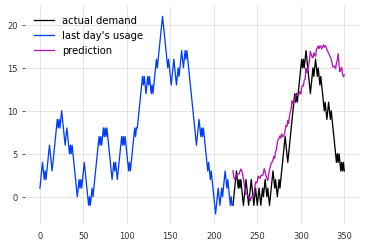

In [ ]:
res_interp = plot_forecast(model_interpretable, pd.Timestamp('2021-08-01'), pd.Timestamp('2021-09-10'), "Canal St & Adams St")